In [1]:
#### Rama projektowa - Opisywanie obrazów z wykorzystaniem głębokiego uczenia
#### autorzy: Anna Konieczna, Mateusz Ostrowski

### Rama projektowa
Tutorial: https://towardsdatascience.com/image-captioning-with-keras-teaching-computers-to-describe-pictures-c88a46a311b8 <br>
Zbiór danych: <br>
### Model atencji Transformers
Tutorial: https://www.analyticsvidhya.com/blog/2021/01/implementation-of-attention-mechanism-for-caption-generation-on-transformers-using-tensorflow/
#### Artykuł:  Attention is all you need https://arxiv.org/pdf/1706.03762.pdf<br>


In [2]:
#### Config
config = { "images_path": "../Flickr8k_Dataset/",
           "train_images_path": "../Flickr8k_text/Flickr_8k.trainImages.txt", # file conatains the names of images to be used in train data
           "test_images_path": "../Flickr8k_text/Flickr_8k.testImages.txt",
           "train_path": "../Flickr8k_text/Flickr_8k.trainImages.txt", 
           "token_path": "../Flickr8k_text/Flickr8k.token.txt",
           "word_embedings_path": "../glove/glove.6B.200d.txt",
           "embedings_dim": 200, # Polish - 100
           "train_model": False, # True if you intend to train the model
           "encode_images": False,
           "pretrained_model_path": "",
           "encoded_images_test": "../Pickle/encoded_test_images.pkl",
           "encoded_images_train": "../Pickle/encoded_train_images.pkl",
           "report_path": "",
           "preprocessed_descriptions_save_path": "descriptions.txt",
           "use_lemma": False,
           "spacy_lemma_model": "pl_spacy_model",
           "lstm_model_save_dir": "../model_weights/",
           "lstm_model_save_path": "../model_weights/model_30.h5"}

In [3]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
#from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
#from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
import nltk
from nltk.translate.meteor_score import meteor_score
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu

#metric imports
from numpy import mean
import warnings; warnings.simplefilter('ignore')
from IPython.display import clear_output
import nltk
nltk.download('wordnet')

#additionall imports
import pickle
from collections import Counter
from pandas.core.common import flatten

import sys, time, warnings
warnings.filterwarnings("ignore")
import re

import keras
import tensorflow as tf
from tqdm import tqdm

from keras.utils import plot_model

from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array


from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

/opt/conda/lib/python3.8/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.16.0)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 264401770242808843,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 16249494371331760309
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 640654102132190841
 physical_device_desc: "device: XLA_GPU device"]

In [5]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [6]:
tf.config.list_physical_devices('GPU')

[]

In [7]:
# Load the description set

def load_doc(filename):
	file = open(filename, 'r')
	text = file.read()
	file.close()
	return text

filename = config["token_path"]
# załaduj opisy
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [8]:
# Load the descriptions to dict structure

def load_descriptions(doc):
	mapping = dict()
	for line in doc.split('\n'):
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [9]:
if config["use_lemma"]:
    import spacy
    nlp = spacy.load('pl_spacy_model')

def clean_descriptions(descriptions):
  # prepare translation table for removing punctuation
  table = str.maketrans('', '', string.punctuation)
  for key, desc_list in descriptions.items():
    for i in range(len(desc_list)):
      desc = desc_list[i]
      if config["use_lemma"]:
          doc = nlp(desc)
      # tokenize
      desc = desc.split()
      # convert to lower case
      desc = [word.lower() for word in desc]
# Lematyzacja
#### spacy model from here: http://zil.ipipan.waw.pl/SpacyPL?action=AttachFile&do=view&target=pl_spacy_model-0.1.0.tar.gz
#### spacy dokumentacja - https://spacy.io/usage
      if config["use_lemma"]:
          desc = [word.lemma_ for word in doc]
      # remove punctuation from each token
      desc = [w.translate(table) for w in desc]
      # remove tokens with numbers in them
      desc = [word for word in desc if word.isalpha()]
      # store as string
      desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [10]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8775


In [11]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, config["preprocessed_descriptions_save_path"])

In [12]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = config["train_path"]
train = load_set(filename)
print('Train Dataset: %d' % len(train))

#load test dataset (1K)
filename = config["test_images_path"]
test = load_set(filename)
print('Test Dataset: %d' % len(test))

Train Dataset: 6000
Test Dataset: 1000


In [13]:
# Below path contains all the images
images = config["images_path"]
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [14]:
# Read the train image names in a set
train_images = set(open(config["train_images_path"], 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [15]:
# Below file conatains the names of images to be used in test data
test_images_file = config["test_images_path"]
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images
print('Test images: %d' % len(test_img))

Test images: 1000


In [16]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions(config["preprocessed_descriptions_save_path"], train)
test_descriptions = load_clean_descriptions(config["preprocessed_descriptions_save_path"], test)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


In [18]:
def load_image(images_path):
   img = tf.io.read_file(images_path)
   img = tf.image.decode_jpeg(img, channels=3)
   img = tf.image.resize(img, (299, 299))
   img = tf.keras.applications.inception_v3.preprocess_input(img)
   return img, images_path

image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

image_features_extract_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [19]:
#encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(train_img)
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

In [20]:

%%time
for img, path in tqdm(image_dataset):
 batch_features = image_features_extract_model(img)
 batch_features = tf.reshape(batch_features,
                             (batch_features.shape[0], -1, batch_features.shape[3]))

 for bf, p in zip(batch_features, path):
   path_of_feature = p.numpy().decode("utf-8")
   np.save(path_of_feature, bf.numpy())



100%|██████████| 375/375 [04:42<00:00,  1.33it/s]

CPU times: user 33min 4s, sys: 3min 47s, total: 36min 51s
Wall time: 4min 42s


In [23]:
# Create a list of all the training captions
all_train_captions = []
img_name_train = []

for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
        img_name_train.append(config["images_path"] + key + ".jpg")

all_train_captions, img_name_train = shuffle(all_train_captions, img_name_train, random_state=1)

num_of_baths = len(img_name_train) // 64
num = num_of_baths * 64

all_train_captions = all_train_captions[:num]
img_name_train = img_name_train[:num]

print(len(all_train_captions))

29952


In [24]:
# Create a list of all the testing captions
all_test_captions = []
for key, val in test_descriptions.items():
    for cap in val:
        all_test_captions.append(cap)
len(all_test_captions)

5000

In [25]:
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(all_train_captions)
train_seqs = tokenizer.texts_to_sequences(all_train_captions)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(all_train_captions)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [26]:
all_train_captions[:3]

['startseq a large brown dog sniffs a small white dog s behind endseq',
 'startseq man rides bike while grimacing endseq',
 'startseq a black and white dog is running through a grassy area endseq']

In [27]:
train_seqs[:3]

[[3, 2, 59, 26, 10, 1407, 2, 53, 15, 10, 158, 98, 4],
 [3, 12, 133, 79, 36, 4477, 4],
 [3, 2, 16, 9, 15, 10, 8, 33, 34, 2, 126, 152, 4]]

In [28]:
cap_vector.shape

(29952, 37)

In [29]:
def calc_max_length(tensor):
   return max(len(t) for t in tensor)
max_length = calc_max_length(train_seqs)

def calc_min_length(tensor):
   return min(len(t) for t in tensor)
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 37 : 4


In [31]:
cap_train = cap_vector

In [32]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
num_steps = len(img_name_train) // BATCH_SIZE

In [33]:
def map_func(img_name, cap):
 img_tensor = np.load(img_name.decode('utf-8')+'.npy')
 return img_tensor, cap
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
        map_func, [item1, item2], [tf.float32, tf.int32]),
         num_parallel_calls=tf.data.experimental.AUTOTUNE)

dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [34]:
def get_angles(pos, i, d_model):
  angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
  return pos * angle_rates

In [35]:
def positional_encoding_1d(position, d_model):
  angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)
  
  # apply sin to even indices in the array; 2i
  angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
  
  # apply cos to odd indices in the array; 2i+1
  angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    
  pos_encoding = angle_rads[np.newaxis, ...]
    
  return tf.cast(pos_encoding, dtype=tf.float32)

In [36]:
def positional_encoding_2d(row,col,d_model):
  assert d_model % 2 == 0
  # first d_model/2 encode row embedding and second d_model/2 encode column embedding
  row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
  col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)
  angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
  #apply sin and cos to odd and even indices resp.
  angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
  angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
  angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
  angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
  pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)

In [37]:
def create_padding_mask(seq):
  seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
  
  # add extra dimensions to add the padding
  # to the attention logits.
  return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [38]:
def create_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

In [39]:
def scaled_dot_product_attention(q, k, v, mask):
  """Calculate the attention weights.
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead) 
  but it must be broadcastable for addition.
  
  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable 
          to (..., seq_len_q, seq_len_k). Defaults to None.
    
  Returns:
    output, attention_weights
  """

  matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
  
  # scale matmul_qk
  dk = tf.cast(tf.shape(k)[-1], tf.float32)
  scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

  # add the mask to the scaled tensor.
  if mask is not None:
    scaled_attention_logits += (mask * -1e9)  #adding -Inf where mask is 1 s.t. value get ignored in softmax

  # softmax is normalized on the last axis (seq_len_k) so that the scores
  # add up to 1.
  attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

  output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

  return output, attention_weights

In [40]:
class MultiHeadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = num_heads
    self.d_model = d_model
    
    assert d_model % self.num_heads == 0
    
    self.depth = d_model // self.num_heads
    
    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)
    
    self.dense = tf.keras.layers.Dense(d_model)
        
  def split_heads(self, x, batch_size):
    """Split the last dimension into (num_heads, depth).
    Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
    """
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])
    
  def call(self, v, k, q, mask=None):
    batch_size = tf.shape(q)[0]
    
    q = self.wq(q)  # (batch_size, seq_len, d_model)
    k = self.wk(k)  # (batch_size, seq_len, d_model)
    v = self.wv(v)  # (batch_size, seq_len, d_model)
    
    q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
    v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)
    
    # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
    # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
    scaled_attention, attention_weights = scaled_dot_product_attention(
        q, k, v, mask)
    
    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

    concat_attention = tf.reshape(scaled_attention, 
                                  (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

    output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
        
    return output, attention_weights

In [41]:
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [42]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    
  def call(self, x, training, mask=None):

    attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)
    
    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
    
    return out2

In [43]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiHeadAttention(d_model, num_heads)
    self.mha2 = MultiHeadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)
 
    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)
    
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):
    # enc_output.shape == (batch_size, input_seq_len, d_model)

    # using look ahead mask so that during self attention current query dont consider future token
    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)
    
    # use padding mask to avoid padded values of both enc_output and dec_input
    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)
    
    ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
    
    return out3, attn_weights_block1, attn_weights_block2

In [44]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff,
               row_size,col_size,rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
    self.pos_encoding = positional_encoding_2d(row_size,col_size, 
                                            self.d_model)
    
    
    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
  
    self.dropout = tf.keras.layers.Dropout(rate)
        
  def call(self, x, training, mask=None):
    # shape(x) = (batch_size,seq_len(H*W),features)
    seq_len = tf.shape(x)[1]
    
    # adding embedding and position encoding.
    x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)
    
    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask)
    
    return x  # (batch_size, input_seq_len, d_model)

In [45]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)
    
    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)
    
  def call(self, x, enc_output, training, 
           look_ahead_mask=None, padding_mask=None):

    seq_len = tf.shape(x)[1]
    attention_weights = {}
    
    x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]
    
    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)
      
      attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
      attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
    
    # x.shape == (batch_size, target_seq_len, d_model)
    return x, attention_weights

In [46]:
class Transformer(tf.keras.Model):
  def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size, 
               target_vocab_size,max_pos_encoding, rate=0.1):
    super(Transformer, self).__init__()

    self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff, 
                           target_vocab_size,max_pos_encoding, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)
    
  def call(self, inp, tar, training,look_ahead_mask=None, dec_padding_mask=None,enc_padding_mask=None):

    enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)
    
    # dec_output.shape == (batch_size, tar_seq_len, d_model)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)
    
    final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)
    
    return final_output, attention_weights

In [47]:
num_layer = 7
d_model = 512
dff = 2048
num_heads = 8
row_size = 8
col_size = 8
target_vocab_size = top_k + 1
dropout_rate = 0.1

In [48]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()
    
    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps
    
  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)
    
    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [49]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, 
                                     epsilon=1e-9)

In [50]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

In [51]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask
  
  return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [52]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='train_accuracy')

In [53]:
transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [54]:
def create_masks_decoder(tar):
  look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
  dec_target_padding_mask = create_padding_mask(tar)
  combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
  return combined_mask

In [55]:
@tf.function
def train_step(img_tensor, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]
  
  dec_mask = create_masks_decoder(tar_inp)
  
  with tf.GradientTape() as tape:
    predictions, _ = transformer(img_tensor, tar_inp, 
                                 True,  
                                 dec_mask)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)    
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
  
  train_loss(loss)
  train_accuracy(tar_real, predictions)

In [56]:
checkpoint_path_ckpt = "./tmp/model"
ckpt = tf.train.Checkpoint(optimizer = optimizer, model = transformer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)
status = ckpt.restore(ckpt_manager.latest_checkpoint)

In [57]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [58]:
# Increase number of epochs to get better caption precision. 
# It increases learning time

# change if learning was interruped t last epoch fully trained
start_epoch = 0

for epoch in range(start_epoch, 30):
  start = time.time()
  
  train_loss.reset_states()
  train_accuracy.reset_states()
  
  for (batch, (img_tensor, tar)) in enumerate(dataset):
    train_step(img_tensor, tar)
    
    if batch % 50 == 0:
      print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
          epoch + 1, batch, train_loss.result(), train_accuracy.result()))
      
    
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                train_loss.result(), 
                                                train_accuracy.result()))

  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))
  ckpt_manager.save() 

Epoch 1 Batch 0 Loss 8.5795 Accuracy 0.0000
Epoch 1 Batch 50 Loss 7.8724 Accuracy 0.0292
Epoch 1 Batch 100 Loss 7.4091 Accuracy 0.0361
Epoch 1 Batch 150 Loss 7.0905 Accuracy 0.0405
Epoch 1 Batch 200 Loss 6.7904 Accuracy 0.0443
Epoch 1 Batch 250 Loss 6.5083 Accuracy 0.0480
Epoch 1 Batch 300 Loss 6.2554 Accuracy 0.0525
Epoch 1 Batch 350 Loss 6.0368 Accuracy 0.0565
Epoch 1 Batch 400 Loss 5.8462 Accuracy 0.0603
Epoch 1 Batch 450 Loss 5.6764 Accuracy 0.0638
Epoch 1 Loss 5.6246 Accuracy 0.0648
Time taken for 1 epoch: 1526.2897112369537 secs

Epoch 2 Batch 0 Loss 4.3388 Accuracy 0.0911
Epoch 2 Batch 50 Loss 4.2280 Accuracy 0.0938
Epoch 2 Batch 100 Loss 4.1613 Accuracy 0.0957
Epoch 2 Batch 150 Loss 4.0813 Accuracy 0.0974
Epoch 2 Batch 200 Loss 4.0225 Accuracy 0.0988
Epoch 2 Batch 250 Loss 3.9719 Accuracy 0.1000
Epoch 2 Batch 300 Loss 3.9295 Accuracy 0.1009
Epoch 2 Batch 350 Loss 3.8886 Accuracy 0.1018
Epoch 2 Batch 400 Loss 3.8492 Accuracy 0.1027
Epoch 2 Batch 450 Loss 3.8127 Accuracy 0.1036
E

In [59]:
transformer.save_weights('image_caption_transformer_30.h5')

In [60]:
def evaluate(image):

  temp_input = tf.expand_dims(load_image(image)[0], 0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
  
  start_token = tokenizer.word_index['startseq']
  end_token = tokenizer.word_index['endseq']
   
  #decoder input is start token.
  decoder_input = [start_token]
  output = tf.expand_dims(decoder_input, 0) #tokens
  result = [] #word list

  for i in range(100):
      dec_mask = create_masks_decoder(output)
  
      # predictions.shape == (batch_size, seq_len, vocab_size)
      predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
      
      # select the last word from the seq_len dimension
      predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
      # return the result if the predicted_id is equal to the end token
      if predicted_id == end_token:
          return result,tf.squeeze(output, axis=0), attention_weights
      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      result.append(tokenizer.index_word[int(predicted_id)])
      output = tf.concat([output, predicted_id], axis=-1)

  return result,tf.squeeze(output, axis=0), attention_weights

In [61]:
def plot_attention(image, result, attention_plot):
   temp_image = np.array(Image.open(image))
   fig = plt.figure(figsize=(10, 10))
   len_result = len(result)
   for l in range(len_result):
       temp_att = np.resize(attention_plot[l], (8, 8))
       ax = fig.add_subplot(len_result//2, len_result//2, l+1)
       ax.set_title(result[l])
       img = ax.imshow(temp_image)
       ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

   plt.tight_layout()
   plt.show()

In [62]:
def remove_unknown_token(result):
    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)
    
    return result   

In [63]:
def final_prediction(result):       
    return ' '.join(remove_unknown_token(result))

In [68]:
#### Metrics
##### Cider
#function for calculating cider metric
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def cider(given_captions, prediction):
    prediction_arr = []
    prediction_arr.append(prediction)
    vectorizer = TfidfVectorizer()
    trainedV = vectorizer.fit(given_captions)
    givenTfIdf = trainedV.transform(given_captions).toarray()
    predTfIdf = trainedV.transform(prediction_arr).toarray()
    partialCiders = 0
    help_arr = []
    
    for c in givenTfIdf:
        help_arr.append(c)
        partialCiders = partialCiders + cosine_similarity(predTfIdf,help_arr)
        help_arr = []
        
    return partialCiders/len(givenTfIdf)

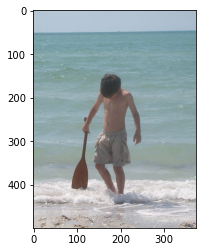


Image name: 533979933_a95b03323b.jpg

Valid descriptions:
['a boy holding an oar walk through the ocean', 'a boy is carrying a paddle whilst walking through the water on a beach', 'a boy is on the beach with a paddle in his hand as he walks through the ocean water', 'a boy with an oar walks out of the surf and onto a beach', 'a little boy walks with a paddle out into the sand']

Transformers attention: a boy in a red wetsuit is holding a surfboard in the ocean

Bleu1: 0.6410499775216034

Bleu2: 0.3145333391575357

Bleu3: 1.3493611291003078e-102

Bleu4: 8.050112034667295e-155

Meteor: 0.39574468085106385

Cider: 0.2262298629379292

 -----------------


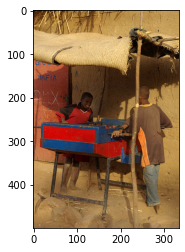


Image name: 2105756457_a100d8434e.jpg

Valid descriptions:
['two children standing under an awning', 'two kids are playing a game of foosball', 'two kids in a developing nation are playing a table top game under an awning made from burlap', 'two men play a game beneath a shade', 'two young kids are in a hut']

Transformers attention: a man in a wheelchair is looking at a wooden rail

Bleu1: 0.2727272727272727

Bleu2: 0.1651445647689541

Bleu3: 8.969564888200866e-103

Bleu4: 6.061838450024688e-155

Meteor: 0.14771997430956968

Cider: 0.1299682583662939

 -----------------


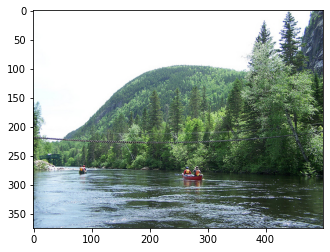


Image name: 2657484284_daa07a3a1b.jpg

Valid descriptions:
['a kayak on the river is passing by a wire bridge that joins both banks', 'some people ride their kayaks down the river', 'two conoes float down the river', 'two groups are canoeing on a river overlooking a mountain', 'two people rafting down a river a footbridge in the background']

Transformers attention: two people are walking in a river

Bleu1: 0.8571428571428571

Bleu2: 0.5345224838248488

Bleu3: 1.969752860473195e-102

Bleu4: 1.0905741632475476e-154

Meteor: 0.35094339622641507

Cider: 0.26430784696600035

 -----------------


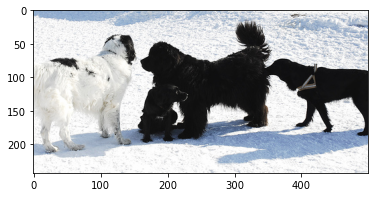


Image name: 317383917_d8bfa350b6.jpg

Valid descriptions:
['a group of dogs stand in the snow', 'four dogs stand in the snow', 'three black dogs and a white dog are standing in the snow', 'two black dogs a black puppy and a white dog in the snow', 'two large black dogs one small black dog and one large white dog are standing in some snow']

Transformers attention: two dogs are playing in the snow

Bleu1: 0.8571428571428571

Bleu2: 0.5345224838248488

Bleu3: 0.38826476133142634

Bleu4: 5.971405938334709e-78

Meteor: 0.6147540983606558

Cider: 0.399790101656869

 -----------------


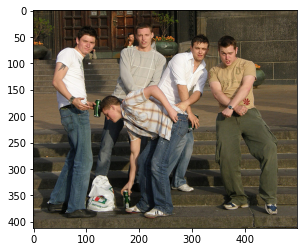


Image name: 498444334_a680d318a1.jpg

Valid descriptions:
['a group of young men clowning around while enjoying a beverage', 'five men pose awkwardly on steps', 'five young men pose on the steps', 'four boys posing while one boy sets his drink down', 'group of young men posing and holding cans']

Transformers attention: two people sit on a bench

Bleu1: 0.3333333333333333

Bleu2: 8.612150057732663e-155

Bleu3: 6.1238719089898906e-204

Bleu4: 1.384292958842266e-231

Meteor: 0.2717391304347826

Cider: 0.1586794920661863

 -----------------


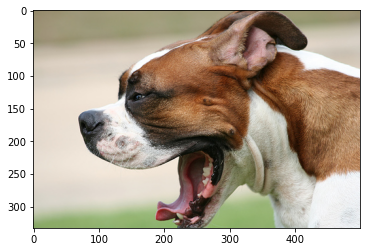


Image name: 256085101_2c2617c5d0.jpg

Valid descriptions:
['a dog with its mouth opened', 'brown and white dog yawning', 'closeup of dog in profile with mouth open', 'dog yawns', 'the dog s mouth is open like he is yawning']

Transformers attention: a brown dog with a red collar is chest in the water

Bleu1: 0.5833333333333334

Bleu2: 0.23028309323591914

Bleu3: 1.1255784929778037e-102

Bleu4: 7.15819034963064e-155

Meteor: 0.3872053872053872

Cider: 0.2856660319505132

 -----------------


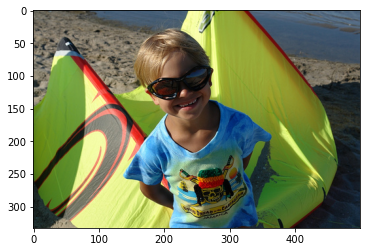


Image name: 1343426964_cde3fb54e8.jpg

Valid descriptions:
['a blond boy in a blue tee shirts stands smiling before a craft of green nylon fabric', 'a child poses wearing glasses near water outside', 'a small girl smiling on the beach', 'a young kid at the beach', 'a young man wearing swimming goggles wearing a blue shirt with a pirate skull on it']

Transformers attention: a woman in a red shirt and goggles is smiling

Bleu1: 0.6

Bleu2: 0.25819888974716104

Bleu3: 1.2142135061437316e-102

Bleu4: 7.57965434483665e-155

Meteor: 0.15337423312883436

Cider: 0.13821270319598247

 -----------------


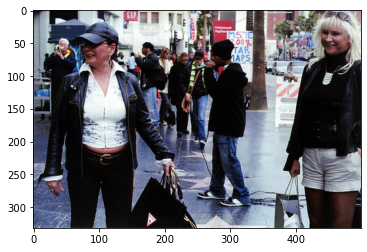


Image name: 2182488373_df73c7cc09.jpg

Valid descriptions:
['a city street with two ladies that have shopping bags in their hands with a crowd behind them', 'a woman in a hat holding a handbag smiles away from another woman wearing sunglasses and holding a shopping bag', 'people are standing on the hollywood walk of fame', 'two older women walking down the busy street with shopping bags', 'two women dressed in leather are standing on a city street']

Transformers attention: a group of people are standing together near a building

Bleu1: 0.6

Bleu2: 0.36514837167011066

Bleu3: 0.25762713262872144

Bleu4: 4.38832006142665e-78

Meteor: 0.412087912087912

Cider: 0.18756808318293983

 -----------------


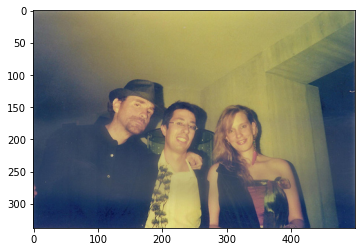


Image name: 3220126881_b0a4f7cccb.jpg

Valid descriptions:
['three people stand by a doorway posing for a photograph', 'two men and a woman pose for a picture', 'two men and a woman smile at the camera', 'two men and a woman standing near a doorway', 'two men and a woman with their arms around each other']

Transformers attention: a woman and a woman are laid in front of a woman in a black shirt

Bleu1: 0.25

Bleu2: 0.1825741858350554

Bleu3: 0.13437149040833538

Bleu4: 2.697887185123482e-78

Meteor: 0.3835051546391753

Cider: 0.258912189260592

 -----------------


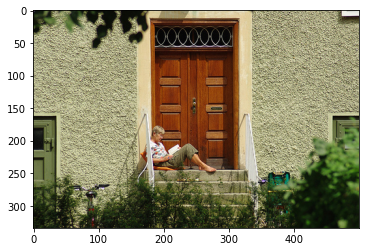


Image name: 3729525173_7f984ed776.jpg

Valid descriptions:
['a lady sitting on a front porch reading a book', 'a person sits at a doorstep and reads a book', 'a woman is reading literature and sitting on the front stoop of a building', 'a woman sits and reads in the stoop of a wooden door', 'a woman sits and reads on the front stoop of her building']

Transformers attention: a skateboarder is balancing on a wooden structure

Bleu1: 0.48675048941962806

Bleu2: 0.3291033976993491

Bleu3: 1.3095038908352e-102

Bleu4: 7.551819280284158e-155

Meteor: 0.22030651340996166

Cider: 0.17266492698397112

 -----------------


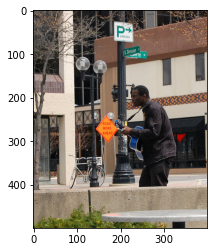


Image name: 3499720588_c32590108e.jpg

Valid descriptions:
['a dark skinned man plays a blue guitar on the street', 'a man playing his guitar on the street surrounded by buildings and street lights', 'a man plays a blue guitar on the an empty urban street', 'a man walking the streets while playing the guitar', 'the man plays his guitar on the local streets']

Transformers attention: a man stands on the sidewalk

Bleu1: 0.4043537731417556

Bleu2: 0.31321108587083024

Bleu3: 1.1648907333117204e-102

Bleu4: 6.501553757486207e-155

Meteor: 0.30059523809523814

Cider: 0.395075773330959

 -----------------


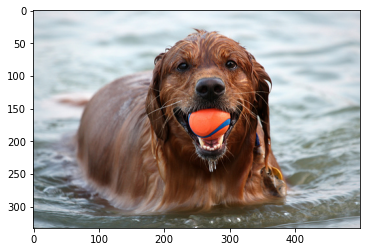


Image name: 3048597471_5697538daf.jpg

Valid descriptions:
['a brown dog is swimming through water with an orange ball in its mouth', 'a dark brow dog holds an orange ball in his mouth while walking through water', 'a dog wading in the water with a ball in his mouth', 'a wet brownishred dog with an orange ball in his mouth is swimming in some water', 'brown dog in water with orange and blue ball in mouth']

Transformers attention: a dog with a orange toy in its mouth

Bleu1: 0.7117665803704959

Bleu2: 0.5968344216828737

Bleu3: 0.34662214862645513

Bleu4: 5.190791522792125e-78

Meteor: 0.43684710351377026

Cider: 0.4108730285586569

 -----------------


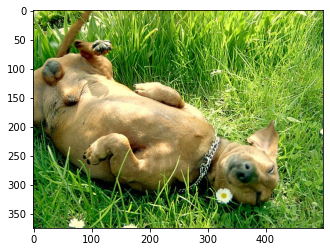


Image name: 229862312_1a0ba19dab.jpg

Valid descriptions:
['a brown puppy is laying on its back in the grass', 'a dog lays down in the long green grass', 'a dog rolling in the grass', 'a dog rolls in the grass', 'a golden dog is laying on its back in the grass']

Transformers attention: two dogs are playing in the grass

Bleu1: 0.42857142857142855

Bleu2: 0.3779644730092272

Bleu3: 0.30674520139260114

Bleu4: 5.021333847570327e-78

Meteor: 0.7311475409836065

Cider: 0.4471237881602462

 -----------------


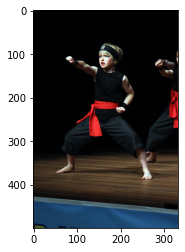


Image name: 3220161734_77f42734b9.jpg

Valid descriptions:
['a blond haired child in a black outfit and red belt doing karate', 'a child with a red sash practices martial arts', 'a girl in a black outfit with a red sash and a black headband has one hand on her waist and one extended straight out', 'a young boy wearing a black uniform with a red sash taking part in a martial arts exposition', 'a young child with a red belt does a demonstration']

Transformers attention: a man in a green shirt is jumping in the air

Bleu1: 0.2727272727272727

Bleu2: 0.1651445647689541

Bleu3: 8.969564888200866e-103

Bleu4: 6.061838450024688e-155

Meteor: 0.11718749999999999

Cider: 0.12110972877790997

 -----------------


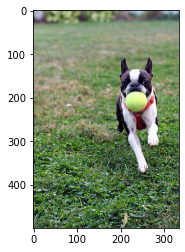


Image name: 1523984678_edd68464da.jpg

Valid descriptions:
['a dog is running with a yellow tennis ball and wearing a red harness', 'a small black and white dog running through the grass with a tennis ball in his mouth', 'small black and white dog wearing a red harness is running around with a ball in its mouth', 'small dog with red harness fetching a ball', 'the dog wearing the red collar is running across the grass with a ball in its mouth']

Transformers attention: a white and white dog with a blue toy in its mouth runs on a grassy path

Bleu1: 0.5882352941176471

Bleu2: 0.4696682183138622

Bleu3: 0.31067583063922666

Bleu4: 5.057855045197707e-78

Meteor: 0.535343275312803

Cider: 0.3312972723081856

 -----------------


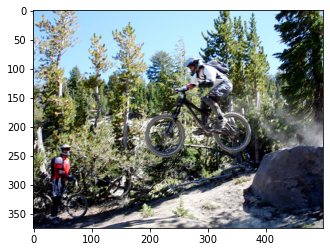


Image name: 136552115_6dc3e7231c.jpg

Valid descriptions:
['a helmeted man jumping off a rock on a mountain bike', 'a man jumping on his bmx with another bmxer watching', 'a mountain biker is jumping his bike over a rock as another cyclist stands on the trail watching', 'a person taking a jump off a rock on a dirt bike', 'the bike rider jumps off a rock']

Transformers attention: a man rides a bike through the woods

Bleu1: 0.625

Bleu2: 0.2988071523335984

Bleu3: 1.337643905120355e-102

Bleu4: 8.15394372921771e-155

Meteor: 0.2112676056338028

Cider: 0.26003796029514553

 -----------------


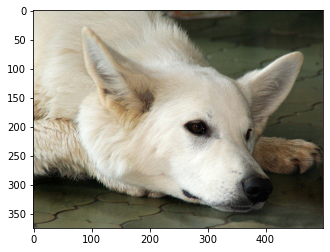


Image name: 1084040636_97d9633581.jpg

Valid descriptions:
['a closeup of a white dog that is laying its head on its paws', 'a large white dog lying on the floor', 'a white dog has its head on the ground', 'a white dog is resting its head on a tiled floor with its eyes open', 'a white dog rests its head on the patio bricks']

Transformers attention: a white dog is splashing in a deep puddle

Bleu1: 0.5555555555555556

Bleu2: 0.45643546458763845

Bleu3: 0.3918277695377932

Bleu4: 0.3155984539112945

Meteor: 0.3361111111111111

Cider: 0.27507486679526266

 -----------------


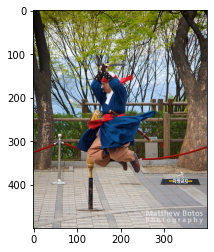


Image name: 3568197730_a071d7595b.jpg

Valid descriptions:
['a japanese swordsman jumps into the air', 'a man in a blue outfit is swinging a sword in the air', 'an actor dressed as a pirate performs in an outdoor park', 'a person wearing a blue robe is in the air holding a sword', 'man in martial artsstyle costume jumping in midair']

Transformers attention: a man is helping a skateboard trick on a skateboard

Bleu1: 0.45241870901797976

Bleu2: 0.2132722247215179

Bleu3: 1.0326282155307133e-102

Bleu4: 6.552765724042392e-155

Meteor: 0.2929133858267717

Cider: 0.17369175635309467

 -----------------


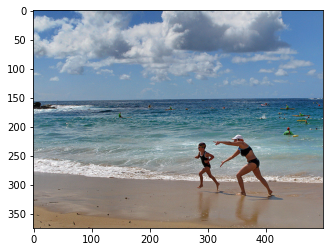


Image name: 1982852140_56425fa7a2.jpg

Valid descriptions:
['an adult and a child run on the beach', 'a woman and a little girl playing in the sand next to the ocean', 'two people run down the beach and one of them is pointing', 'two people running on a beach', 'two people running on the shore of a beach']

Transformers attention: a man and a woman are standing on the beach

Bleu1: 0.7

Bleu2: 0.557773351022717

Bleu3: 0.34126630239263067

Bleu4: 5.423660437707094e-78

Meteor: 0.5318681318681319

Cider: 0.3409645633153584

 -----------------


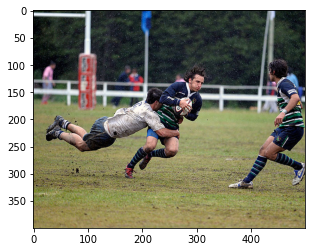


Image name: 3109704348_c6416244ce.jpg

Valid descriptions:
['during a game of rugby a man tackles another', 'men play football', 'the guys are playing a sport', 'the man with the soccor ball is being hit by another man', 'three men play ball in a field']

Transformers attention: two men playing soccer

Bleu1: 0.5

Bleu2: 1.0547686614863434e-154

Bleu3: 7.029057988834377e-204

Bleu4: 1.5319719891192393e-231

Meteor: 0.8243727598566307

Cider: 0.18448536196089055

 -----------------


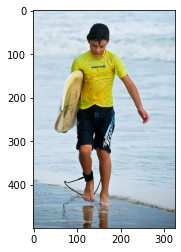


Image name: 2559921948_06af25d566.jpg

Valid descriptions:
['a boy in a yellow shirt is walking on a beach holding a surfboard', 'a boy in a yellow shirt walks with his surfboard out of the ocean', 'a little boy at the beach with a surfboard', 'a young boy in a yellow rash guard is walking on the shore carrying a surfboard', 'a young boy wearing a yellow shirt walking on the beach carrying a surfboard']

Transformers attention: a woman in a red shirt is standing on a beach with a smile in the air

Bleu1: 0.6470588235294118

Bleu2: 0.492592183071889

Bleu3: 0.32090832308773337

Bleu4: 5.179818589191765e-78

Meteor: 0.5361305361305361

Cider: 0.41061496888981763

 -----------------


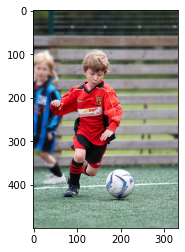


Image name: 3545652636_0746537307.jpg

Valid descriptions:
['a boy soccer player running down the field', 'a small boy wearing red runs towards a soccer ball', 'a young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind', 'a young boy wearing a red uniform lines up to kick a soccer ball', 'little boy in red getting ready to kick soccer ball while other boy watches']

Transformers attention: a boy in a red uniform is kicking a soccer ball

Bleu1: 0.8181818181818182

Bleu2: 0.7567874686642695

Bleu3: 0.5778315878793147

Bleu4: 0.39303765107598937

Meteor: 0.6843065693430658

Cider: 0.3570724976444256

 -----------------


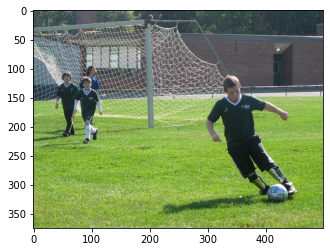


Image name: 2913965136_2d00136697.jpg

Valid descriptions:
['a boy in a green uniform is kicking a soccer ball in a game while two others stand behind him', 'boys play soccer near a goal post', 'some children are playing soccer on a sportsfield by the goal', 'the little boy gets ready to kick the soccer ball', 'three boys play soccer']

Transformers attention: a boy in a red shirt kicks a soccer ball

Bleu1: 0.7

Bleu2: 0.6236095644623235

Bleu3: 0.5278660430282169

Bleu4: 0.37991784282579627

Meteor: 0.372

Cider: 0.21449479734132204

 -----------------


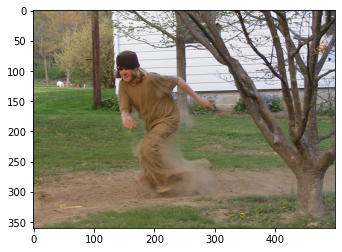


Image name: 2480850054_de3433b54a.jpg

Valid descriptions:
['a boy is kicking up dust as he runs in the dirt by a tree', 'a boy wearing brown running in dirt', 'a dirty boy runs through the dirt', 'a dusty boy runs along a dirt path through the grass', 'a teenage boy runs through the dirt near a house in the country']

Transformers attention: a brown dog is jumping on the grass

Bleu1: 0.625

Bleu2: 0.2988071523335984

Bleu3: 1.337643905120355e-102

Bleu4: 8.15394372921771e-155

Meteor: 0.2949766355140187

Cider: 0.21224365996509267

 -----------------


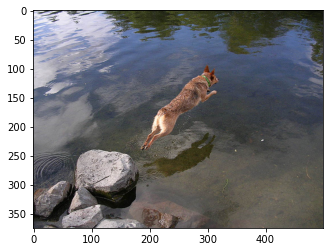


Image name: 3040033126_9f4b88261b.jpg

Valid descriptions:
['a brown dog jumping off a rock into a lake', 'a brown dog leaps into water from a rock', 'a dog is taking a dive into a body of water', 'a dog leaps over the water from a rock', 'the dog is leaping into the water']

Transformers attention: a dog is jumping into the water

Bleu1: 1.0

Bleu2: 0.816496580927726

Bleu3: 0.6465017155391986

Bleu4: 8.776640122853315e-78

Meteor: 0.6914285714285714

Cider: 0.41426490366300167

 -----------------


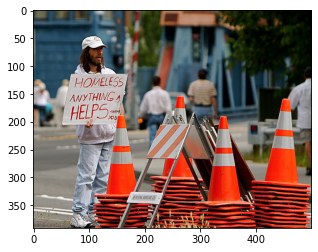


Image name: 2612488996_9450de0e54.jpg

Valid descriptions:
['a homeless man in a white cap is standing behind large orange cones', 'a homeless man standing in a construction site', 'a homeless man stands with a sign next to orange construction cones', 'a man holds a sign reading homeless anything helps near a construction site', 'stacks of orange safety cones in front of a man holding up a homeless sign']

Transformers attention: a man in a red shirt is walking on the sidewalk

Bleu1: 0.41504578012830107

Bleu2: 0.3371847857444411

Bleu3: 0.22732382654881136

Bleu4: 3.9126302422016713e-78

Meteor: 0.38027108433734946

Cider: 0.2173454326561389

 -----------------


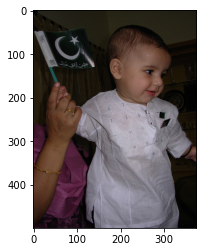


Image name: 1122944218_8eb3607403.jpg

Valid descriptions:
['a baby in a white garment holds a flag with crescent moon and star', 'a baby is holding a small black flag with a moon and a star on it', 'a baby wearing a white gown waves a muslim flag', 'a little toddler dressed in white is smiling while a lady helps him wave a flag', 'baby in white outfit holding black and white flag']

Transformers attention: a man is sitting by a wide chair

Bleu1: 0.3309363384692233

Bleu2: 8.061224930331203e-155

Bleu3: 5.625111631350617e-204

Bleu4: 1.258141043412406e-231

Meteor: 0.10204081632653061

Cider: 0.10687309538740002

 -----------------


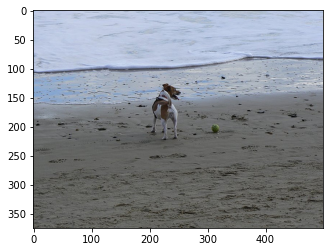


Image name: 533483374_86c5d4c13e.jpg

Valid descriptions:
['a brown and white dog is standing on a beach with a tennis ball beside it', 'a dog is on the beach near a ball', 'a dog on the beach', 'the brown dog is standing next to a ball on the beach', 'the dog stands in the sand near the ocean']

Transformers attention: a dog running on the beach

Bleu1: 0.8333333333333334

Bleu2: 0.7071067811865476

Bleu3: 0.5025606628115007

Bleu4: 7.262123179505913e-78

Meteor: 0.9490196078431373

Cider: 0.5718972968000355

 -----------------


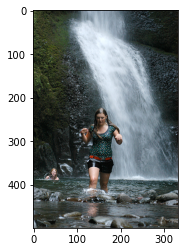


Image name: 219301555_17883a51bd.jpg

Valid descriptions:
['an extremely wet woman is wading in front of a waterfall', 'a woman dressed in shorts and a tshirt walking in shallow water in front of a waterfall', 'a woman wading through a pool in front of a waterfall', 'the lady is walking through the water', 'wet woman walking through water near a large waterfall']

Transformers attention: a young girl is jumping into water

Bleu1: 0.42857142857142855

Bleu2: 9.765260274142007e-155

Bleu3: 6.670144120459188e-204

Bleu4: 1.4740564900137075e-231

Meteor: 0.14285714285714285

Cider: 0.1952725306084259

 -----------------


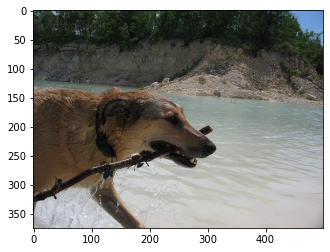


Image name: 352382023_7605223d1c.jpg

Valid descriptions:
['a dog carrying a stick while walking in water', 'a dog with a stick in his mouth walking through water', 'a large brown dog with a stick in his mouth coming out of water', 'a wet dog carrying a stick in its mouth', 'dog retrieving stick in water']

Transformers attention: a dog walking through the water

Bleu1: 0.8333333333333334

Bleu2: 0.5773502691896258

Bleu3: 2.0719622371492502e-102

Bleu4: 1.133422688662942e-154

Meteor: 0.3542857142857143

Cider: 0.3242410072017158

 -----------------


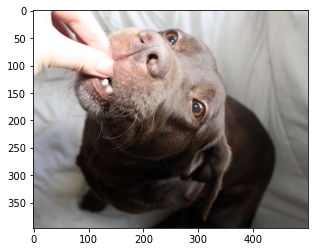


Image name: 2311690895_0d6efe11c8.jpg

Valid descriptions:
['a brown dog looks up while a person s fingers are in its mouth', 'a dog bites someone s finger', 'a dog is chewing on someone s finger', 'a person has his or her hands in a dog s mouth', 'a person touches a dog s tooth']

Transformers attention: a dog is resting on a blanket

Bleu1: 0.7142857142857143

Bleu2: 0.48795003647426655

Bleu3: 0.3649272987247557

Bleu4: 5.705336763108155e-78

Meteor: 0.39952531645569617

Cider: 0.19966373017504846

 -----------------


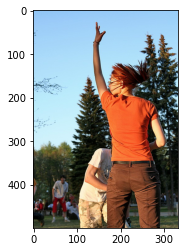


Image name: 3138399980_d6ab8b2272.jpg

Valid descriptions:
['a person in an orange shirt reaching up', 'a person wearing an orange shirt has her hand in the air as others watch', 'a woman in a park stands with her arm up in the air', 'a woman in orange throws her hand in the air', 'the woman in the orange shirt has her hand raised']

Transformers attention: a woman in a black shirt is standing in a park

Bleu1: 0.6363636363636364

Bleu2: 0.504524979109513

Bleu3: 0.44105180496808105

Bleu4: 0.3209138982794099

Meteor: 0.4472257653061224

Cider: 0.34720694741066777

 -----------------


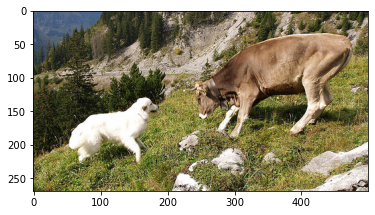


Image name: 2120411340_104eb610b1.jpg

Valid descriptions:
['a dog and a cow are on a rocky slope', 'a dog and a cow are standing on a hillside', 'a white dog looks at a nervous cow in a mountain setting', 'a white dog stands in front of a cow that has its head down and horns directed at the dog', 'two dogs are in a grassy area']

Transformers attention: two dogs are running through a grassy field

Bleu1: 0.625

Bleu2: 0.5175491695067657

Bleu3: 0.3567606562490449

Bleu4: 5.614021910443866e-78

Meteor: 0.8294209702660407

Cider: 0.21507164879744406

 -----------------


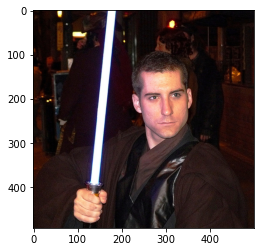


Image name: 1836335410_de8313a64e.jpg

Valid descriptions:
['a man dressed in brown holding a light saber', 'a man wearing a black outfit holding on to a glowing sword', 'man dressed up in black and brown and holding a white light saber', 'the man holds a light sabre', 'the man is playing with his star wars light sword']

Transformers attention: a man in a black shirt and a gold print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print print

Bleu1: 0.07

Bleu2: 0.03760507165451776

Bleu3: 3.332247726475801e-103

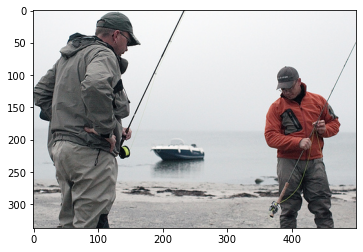


Image name: 488590040_35a3e96c89.jpg

Valid descriptions:
['men standing on shore with fishing pole and boat in water', 'two fisherman looking at the water', 'two men holding their fishing poles', 'two men stand near the water with their fishing poles', 'two men with fishing rods are standing on a shore']

Transformers attention: a man is standing on a boat by a large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large large

Bleu1: 0.04000000000000001

Bleu2: 0.02842676218074807

Bleu3: 0.020341176885813755

Bl

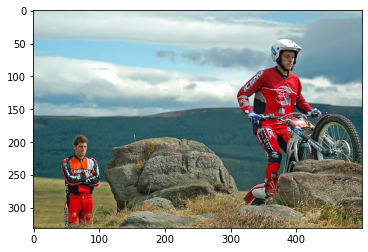


Image name: 219070971_ae43410b9e.jpg

Valid descriptions:
['a dirt biker pushes his motorcycle up a rock while another rider watches', 'a man in red on a dirt bike struggles up a rock while another man in red watches', 'a man in red pushes his motocross bike up a rock', 'a man is looking on as another man attempts to climb a small boulder with his dirt bike', 'a redclad man rides a bike through rocky ground while another man looks on']

Transformers attention: a man in a red shirt riding a bike on a sunny day

Bleu1: 0.6153846153846154

Bleu2: 0.4529108136578383

Bleu3: 0.26742392311919305

Bleu4: 4.513300825451574e-78

Meteor: 0.38070436507936506

Cider: 0.38220463612723304

 -----------------


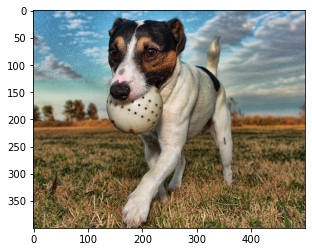


Image name: 3009644534_992e9ea2a7.jpg

Valid descriptions:
['a closeup photo of a small dog with a holey ball in his mouth', 'a dog carrying a white ball', 'a dog fetches a ball in a field', 'a dog trots with a ball in its mouth', 'the dog is carrying a whiffle ball outside']

Transformers attention: a dog running on the grass

Bleu1: 0.5

Bleu2: 0.316227766016838

Bleu3: 1.3855217967617936e-102

Bleu4: 8.38826642100846e-155

Meteor: 0.19230769230769232

Cider: 0.18467666631710877

 -----------------


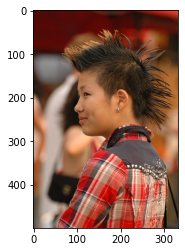


Image name: 1765164972_92dac06fa9.jpg

Valid descriptions:
['a girl with a nose ring earring and mohawk', 'a person with spiky hair looks to the left', 'a profile of a young person with a punk hairstyle and pierced ear and nose in a cowboy shirt', 'a young person with a mohawk and a nose piercing in a plaid shirt', 'the person is posing in a red flannel shirt with a mohawk']

Transformers attention: a girl in a red shirt holds a peace sign

Bleu1: 0.7

Bleu2: 0.4830458915396479

Bleu3: 0.3103584854476396

Bleu4: 5.047284757449962e-78

Meteor: 0.37796610169491524

Cider: 0.2186166716510428

 -----------------


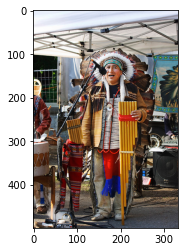


Image name: 3589367895_5d3729e3ea.jpg

Valid descriptions:
['a man dressed as an indian speaking into a microphone', 'a native american stands at a microphone ready to play his instrument', 'an indian chief in full dress', 'indian wearing headgear speaks', 'the man dressed liked an indian wearing feathers is standing in front of the microphone']

Transformers attention: a man plays a piano

Bleu1: 0.6

Bleu2: 0.3872983346207417

Bleu3: 1.5867747841036259e-102

Bleu4: 9.283142785759642e-155

Meteor: 0.2690058479532163

Cider: 0.11210999086612275

 -----------------


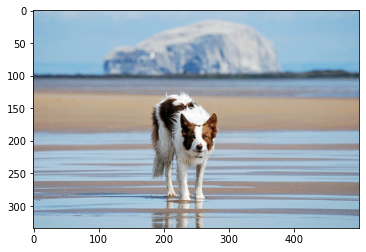


Image name: 3673165148_67f217064f.jpg

Valid descriptions:
['a brown and white dog is standing in shallow water on a beach near a large rock outcrop', 'a brown and white dog on the beach', 'a dog standing on a beach', 'a dog stands on the beach with a large rock behind him', 'an unusual looking dog is standing in front of a beautiful backdrop']

Transformers attention: a white dog with a ears running on the beach

Bleu1: 0.8

Bleu2: 0.5962847939999439

Bleu3: 0.3571171186519998

Bleu4: 5.607773684948284e-78

Meteor: 0.6859756097560975

Cider: 0.38625724112383064

 -----------------


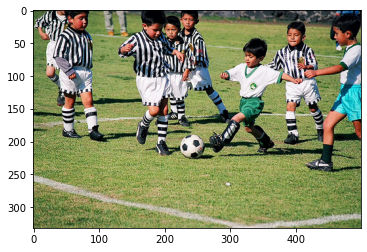


Image name: 2370481277_a3085614c9.jpg

Valid descriptions:
['a group of young boys playing soccer', 'a little boy in green is kicking a soccer ball and boys in referee shirts are following him', 'a young boy kicks a soccer ball while six others play but are dressed as referee', 'little boys play soccer on the field', 'small children kick a soccer ball on a soccer field']

Transformers attention: a soccer player in a red uniform is kicking the soccer ball

Bleu1: 0.75

Bleu2: 0.4522670168666454

Bleu3: 1.7617120296297454e-102

Bleu4: 1.0031587692359528e-154

Meteor: 0.47018807523009204

Cider: 0.2628800454418105

 -----------------


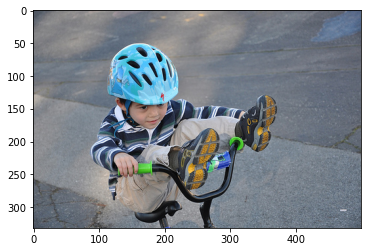


Image name: 3192069971_83c5a90b4c.jpg

Valid descriptions:
['a boy wearing a blue helmet rides a bike with his feet on the handlebars', 'a boy with a blue helmet plays on his bicycle', 'a little boy with a blue helmet rides his bike with his feet on the handlebars', 'boy in blue helmet riding bike with feet on handlebars', 'boy with a helmet resting his feet on the handlebars of his bike']

Transformers attention: a boy in a helmet riding a bike

Bleu1: 0.7788007830714049

Bleu2: 0.6582067953986983

Bleu3: 2.0788721927978864e-102

Bleu4: 1.0679885246768797e-154

Meteor: 0.47024404167261313

Cider: 0.3115030261107848

 -----------------


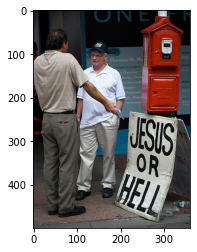


Image name: 2815256108_fc1302117d.jpg

Valid descriptions:
['two men are standing beside a sign that says jesus or hell', 'two men are standing in front of a protest sign resting on a red electric box', 'two men are talking on the street one is pointing at a sign that says jesus or hell beneath a red box and the other is standing there listening', 'two men discuss a sign that says jesus or hell', 'two men talking by a red box and a poster']

Transformers attention: a man in a black shirt and a white coat is standing in front of a store

Bleu1: 0.47058823529411764

Bleu2: 0.42008402520840293

Bleu3: 0.32920633149012957

Bleu4: 0.26647168751984257

Meteor: 0.3493788819875776

Cider: 0.18406003531643073

 -----------------


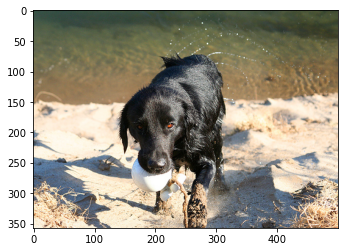


Image name: 280706862_14c30d734a.jpg

Valid descriptions:
['a black dog emerges from the water onto the sand holding a white object in its mouth', 'a black dog emerges from the water with a white ball in its mouth', 'a black dog on a beach carrying a ball in its mouth', 'a black dog walking out of the water with a white ball in his mouth', 'the black dog jumps out of the water with something in its mouth']

Transformers attention: a black dog with a red collar is swimming in water

Bleu1: 0.5810640921796215

Bleu2: 0.39896241882229266

Bleu3: 0.25487573433601857

Bleu4: 4.2559921313859375e-78

Meteor: 0.4632802025919856

Cider: 0.41304581467187373

 -----------------


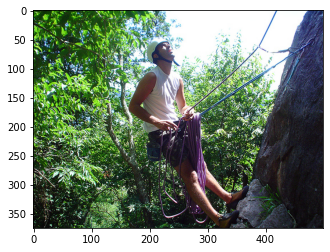


Image name: 143688283_a96ded20f1.jpg

Valid descriptions:
['a man in a harness climbing a rock wall', 'a man with a white shirt and helmet is climbing a mountain', 'a man in a white shirt and helmet is using climbing equipment', 'a young man wearing a white helmet climbing up a rock wall', 'man rock climbing looking up the rock']

Transformers attention: a man in a red shirt and jeans sits on a rock

Bleu1: 0.6666666666666666

Bleu2: 0.5504818825631803

Bleu3: 0.394883862310525

Bleu4: 0.28646290158800986

Meteor: 0.6332138590203108

Cider: 0.383060983285295

 -----------------


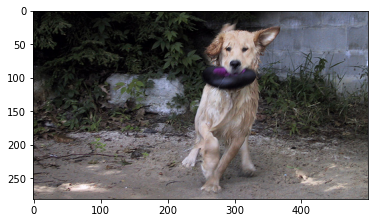


Image name: 429851331_b248ca01cd.jpg

Valid descriptions:
['a brown dog holding something purple and black in its mouth', 'a dog catches black frisbee', 'a large wet yellow dog retrives his toy', 'dog running with toy', 'the wet dog catches a toy while playing on the sand']

Transformers attention: a dog running through the woods

Bleu1: 0.6666666666666666

Bleu2: 0.5163977794943222

Bleu3: 1.9205801300525035e-102

Bleu4: 1.0719249972567852e-154

Meteor: 0.44642857142857145

Cider: 0.23755909670612815

 -----------------


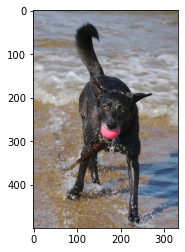


Image name: 505929313_7668f021ab.jpg

Valid descriptions:
['a black dog plays with a ball in the water', 'a black dog runs in the water holding a pink toy in its mouth', 'a black dog standing in shallow water with a pink ball in its mouth', 'a black dog stands in the surf holding a red rubber ball', 'the black dog is running though the water with a pink ball']

Transformers attention: two dogs are playing in the water

Bleu1: 0.2791881675133095

Bleu2: 0.24622082007735305

Bleu3: 0.19982580489736992

Bleu4: 3.271092989210003e-78

Meteor: 0.5269186712485682

Cider: 0.4167672181979672

 -----------------


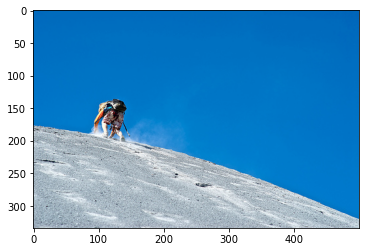


Image name: 3745451546_fc8ec70cbd.jpg

Valid descriptions:
['a hiker ascends a snowy hill', 'a man reaches the top of a tall sand dune', 'a person is hiking to the top of a hill', 'a person walks up a white sandy hill against the blue sky', 'the person is wearing shorts and climbing a gray sand hill under a blue sky']

Transformers attention: a dog is running up a mountain hill

Bleu1: 0.625

Bleu2: 0.2988071523335984

Bleu3: 1.337643905120355e-102

Bleu4: 8.15394372921771e-155

Meteor: 0.2720905172413793

Cider: 0.19981141839568167

 -----------------


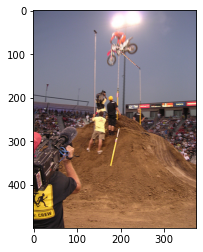


Image name: 2289068031_fe26990183.jpg

Valid descriptions:
['a motocross rider rides in the air over a bar', 'a motorbike jumping a pole', 'a person is jumping a motorcycle over a pole while camera men film', 'a professional dirt biker doing stunts while being videotaped', 'man on a motorcycle performing a trick high in the air']

Transformers attention: two people are hiking down a hill

Bleu1: 0.14285714285714285

Bleu2: 5.637975647982813e-155

Bleu3: 4.591070810041778e-204

Bleu4: 1.1200407237786664e-231

Meteor: 0.09615384615384616

Cider: 0.0

 -----------------


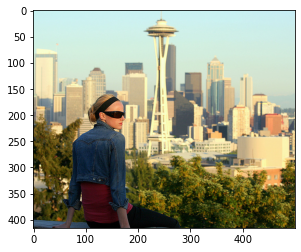


Image name: 524105255_b346f288be.jpg

Valid descriptions:
['a blonde girl poses for a picture at kerry park in seattle', 'a girl in a blue jacket is sitting in front of the seattle skyline', 'a woman looking at view of a city', 'blonde lady looks at space needle', 'blond woman overlooking seattle space needle scene']

Transformers attention: a man in a red shirt and black pants stands on a rock

Bleu1: 0.23076923076923078

Bleu2: 0.1386750490563073

Bleu3: 7.979475359841935e-103

Bleu4: 5.554837769749797e-155

Meteor: 0.12396694214876033

Cider: 0.15336627697632985

 -----------------


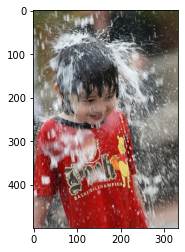


Image name: 3208074567_ac44aeb3f3.jpg

Valid descriptions:
['a boy wearing a red shirt is splashed by water', 'a child with water splashing on him', 'a little boy being splashed by water on his head', 'little kid in red pooh shirt getting wet', 'the little boy in red is getting drenched with water']

Transformers attention: a woman in a red shirt is canoeing

Bleu1: 0.75

Bleu2: 0.5669467095138409

Bleu3: 0.47713192508777724

Bleu4: 0.38260294162784475

Meteor: 0.49387755102040815

Cider: 0.2865669439741875

 -----------------


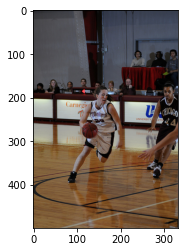


Image name: 3222055946_45f7293bb2.jpg

Valid descriptions:
['a basketball player wearing a black and white uniform dribbles the ball', 'at a women s basketball game a white skinned woman dribbles against the chicago defense', 'basketball players in action', 'the basketball player in white is dribbling the ball towards the player in black', 'woman in white dribbling basketball']

Transformers attention: a man in a white jersey is playing basketball

Bleu1: 0.47768754038252614

Bleu2: 0.20684477252128627

Bleu3: 9.374931675610993e-103

Bleu4: 5.7426464159979025e-155

Meteor: 0.2777777777777778

Cider: 0.30289198475599177

 -----------------


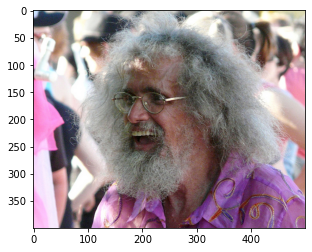


Image name: 2623930900_b9df917b82.jpg

Valid descriptions:
['a man who has a gray beard and gray hair laughs while wearing a purple shirt', 'a man with a bushy beard and pink shirt is smiling', 'a man with disheveled hair and facial hair in a crowd of people is smiling', 'a man with poofy gray hair laughing', 'an old man with white long hair and a white long beard']

Transformers attention: a man in a white hat and a gold chain to a fake gentleman in a black jacket

Bleu1: 0.3888888888888889

Bleu2: 0.30249507099101003

Bleu3: 1.3421343675262578e-102

Bleu4: 8.204107963632781e-155

Meteor: 0.24313725490196078

Cider: 0.17842072811204987

 -----------------


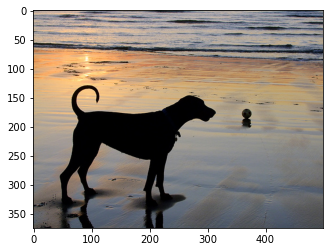


Image name: 3149919755_f9272b10b3.jpg

Valid descriptions:
['a black dog is looking at the ball on the beach by the ocean', 'a dog and a ball on a beach', 'a dog standing on a beach with a ball nearby', 'a dog stands on a beach at sunset', 'dog in shadow on beach at sunset']

Transformers attention: a dog walking on the beach

Bleu1: 0.7054014374088451

Bleu2: 0.5985529678206387

Bleu3: 0.4254084167188494

Bleu4: 6.147254555356275e-78

Meteor: 0.25641025641025644

Cider: 0.38461434896263863

 -----------------


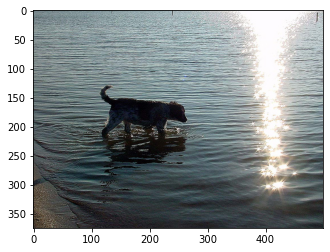


Image name: 3610683688_bbe6d725ed.jpg

Valid descriptions:
['a dog is stepping out into the water towards the sun s reflection', 'a dog is wading in the water', 'a dog wading into the water', 'a dog walking through the pound', 'the dog is walking out into the water and the sun is casting a reflection off of the water']

Transformers attention: a dog walking through the water

Bleu1: 1.0

Bleu2: 1.0

Bleu3: 0.9094319693204538

Bleu4: 0.8408964152537145

Meteor: 0.8300000000000002

Cider: 0.41882784791059857

 -----------------


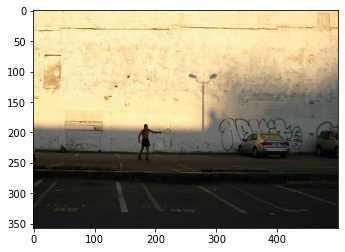


Image name: 1432179046_8e3d75cf81.jpg

Valid descriptions:
['a man in the near distance is pointing to a silver sedan near him', 'a man is playing tennis with himself against a large wall in a parking lot', 'a man walks toward a car in a parking lot', 'man stands outside against wall with tennis racket in dark', 'the man is playing tennis against the building']

Transformers attention: a white race car is taking a corner of a crowd of water

Bleu1: 0.3561388764008908

Bleu2: 8.566004020153672e-155

Bleu3: 5.9531814328657354e-204

Bleu4: 1.328488253493217e-231

Meteor: 0.19417475728155342

Cider: 0.15608738823184165

 -----------------


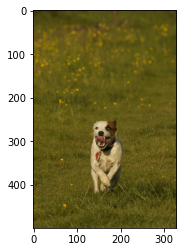


Image name: 3613800013_5a54968ab0.jpg

Valid descriptions:
['a brown and white dog is running with its mouth open accross a field', 'a brown and white dog running in a field covered in yellow flowers', 'a dog running toward the camera in a field', 'a while dog with a spot on his eye running through a meadow', 'a white dog with a brown patch over his eye runs through a grassy field covered in dandelions']

Transformers attention: a white dog with a muzzle running on a path

Bleu1: 0.8

Bleu2: 0.5962847939999439

Bleu3: 0.5131693187155698

Bleu4: 0.4417918226831577

Meteor: 0.45074722802506817

Cider: 0.2903546064533961

 -----------------


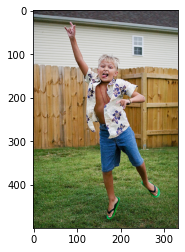


Image name: 2646046871_c3a5dbb971.jpg

Valid descriptions:
['a boy in an open hawaiian shirt is making the longhorns symbol with his hand', 'a boy wearing a flowered shirt raises his arm and jumps', 'a child in hawaiian clothing jumps and poses in a low cut yard nearby a fence and building', 'a child jumping in the air with his or her shirt flying open', 'the boy with his shirt undone is stretching his arm in the air']

Transformers attention: a little girl in a dress and jeans is standing on the sidewalk

Bleu1: 0.46153846153846156

Bleu2: 0.19611613513818402

Bleu3: 1.0100073553143124e-102

Bleu4: 6.60585259847259e-155

Meteor: 0.13513513513513511

Cider: 0.3009554563619704

 -----------------


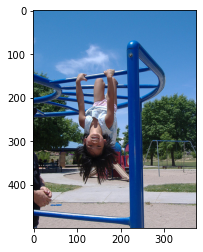


Image name: 537532165_e4b7c0e61a.jpg

Valid descriptions:
['a child playing on the monkey bars at a playground with an adult present', 'a girl hangs on the bars', 'a kid hangs upside down on the monkey bars at a playground', 'a young children hanging upside at the playground', 'girl hanging upside down on blue monkey bars']

Transformers attention: a girl in a dress is hanging upside down from a tree

Bleu1: 0.5

Bleu2: 0.3692744729379982

Bleu3: 0.24068012558410903

Bleu4: 4.1735993043546123e-78

Meteor: 0.44642857142857145

Cider: 0.3337813605466461

 -----------------


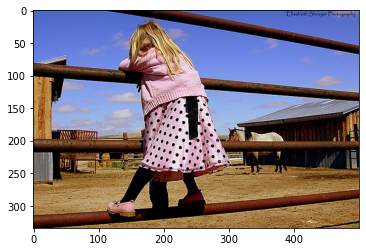


Image name: 3427233064_6af01bfc5c.jpg

Valid descriptions:
['a girl in pink polka dots looks at a horse', 'a girl is hanging on the fence watching a horse', 'a little girl stands on the fence while peeking through it to look at the horse', 'a young girl clings to a fence ant watches the horse on the other side', 'a young girl dressed all in pink is standing on a fence and looking at a horse']

Transformers attention: a boy in a red shirt and jeans climbs on a jungle gym

Bleu1: 0.39572488576635756

Bleu2: 0.1681507428780777

Bleu3: 8.659842648273639e-103

Bleu4: 5.663883907326584e-155

Meteor: 0.1807228915662651

Cider: 0.18417292659969364

 -----------------


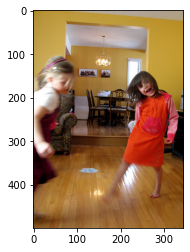


Image name: 3388330419_85d72f7cda.jpg

Valid descriptions:
['children dancing on hardwood flooring', 'two children are playing or dancing inside', 'two little girls dance on a hardwood floor in the house', 'two little girls dancing on the floor', 'two young girls playing in a house']

Transformers attention: a little girl in a pink dress is standing on the sidewalk crying a tennis ball

Bleu1: 0.3125

Bleu2: 0.20412414523193154

Bleu3: 1.0330050694549054e-102

Bleu4: 6.7393716283177006e-155

Meteor: 0.4746835443037974

Cider: 0.3200159768598653

 -----------------


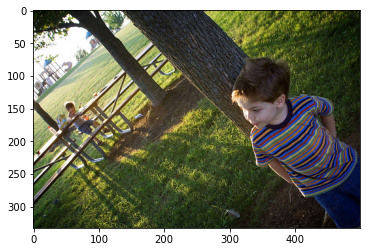


Image name: 2646116932_232573f030.jpg

Valid descriptions:
['a boy hiding behind a tree', 'a boy in a striped tshirt is standing by a tree in front of the picnic tables', 'a little boy in a striped shirt is standing behind a tree', 'a young boy in a striped shirt is leaning against a tree while another child sits at a picnic table', 'two boys in a park one standing near a tree and one sitting at a picnic table with the playground behind them']

Transformers attention: a little girl climbs a fence

Bleu1: 0.5

Bleu2: 0.316227766016838

Bleu3: 1.3855217967617936e-102

Bleu4: 8.38826642100846e-155

Meteor: 0.16666666666666666

Cider: 0.09637207930223367

 -----------------


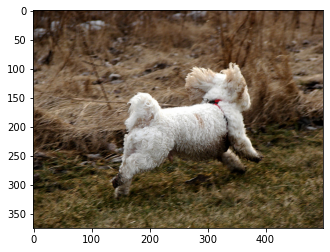


Image name: 416106657_cab2a107a5.jpg

Valid descriptions:
['a fluffy white dog runs through the woods with his ears flapping in the breeze', 'a small white dog is running across a grassy field', 'a white dog runs in the grass', 'a white dog wearing a red harness runs though the woods', 'the little white dog wearing the red collar is running in the grass']

Transformers attention: a white dog running along the grass

Bleu1: 0.8571428571428571

Bleu2: 0.6546536707079771

Bleu3: 0.4438519083986535

Bleu4: 6.608446987146148e-78

Meteor: 0.8412698412698414

Cider: 0.41329991248184383

 -----------------


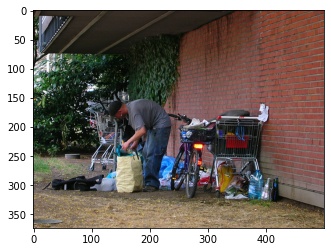


Image name: 2497420371_74788d7ba1.jpg

Valid descriptions:
['a man fiddles with a shopping bag outside near a shopping cart', 'a man gathers his belongings by the side of a building', 'a man in a black cap is opening a bag beside a bicycle and a shopping cart', 'a man looks in a bag near some grocery carts and a bike', 'a man outside at a red brick building with a grocery cart a bike and miscellaneous']

Transformers attention: a man in a red shirt is skating a skateboard on a sidewalk

Bleu1: 0.6153846153846154

Bleu2: 0.4529108136578383

Bleu3: 0.3361554480279229

Bleu4: 0.24712442545253582

Meteor: 0.32554847841472045

Cider: 0.1840955248902524

 -----------------


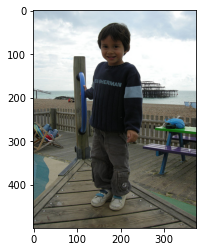


Image name: 1427391496_ea512cbe7f.jpg

Valid descriptions:
['a child in a black shirt standing on a wooden dock near a picnic table', 'a little boy is smiling for the camera on a playground', 'a young boy holds onto a blue handle on a pier', 'a young child stands on a wood dock next to the water', 'boy in green sweater with white stripe on sleeve standing on wood planked floor with body of water in the background']

Transformers attention: a boy in a red shirt is standing on a skateboard

Bleu1: 0.8181818181818182

Bleu2: 0.5720775535473553

Bleu3: 0.33430949327179044

Bleu4: 5.333384990808849e-78

Meteor: 0.3381818181818182

Cider: 0.24733940211936986

 -----------------


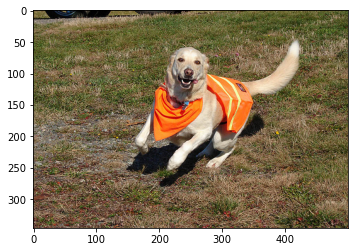


Image name: 3028969146_26929ae0e8.jpg

Valid descriptions:
['a beige dog with orange vest running on withering grass', 'a dog wearing an orange vest scampers playfully across the grass', 'a golden retriever running on short grass wearing an orange outfit', 'a lightcolored dog wearing orange plays in the grass', 'the white dog is wearing orange clothing and running through the grass']

Transformers attention: two dogs are playing in the grass

Bleu1: 0.32206169703226534

Bleu2: 0.284031719055601

Bleu3: 0.23051205360634533

Bleu4: 3.7734183673994593e-78

Meteor: 0.6392045454545455

Cider: 0.2535696329036349

 -----------------


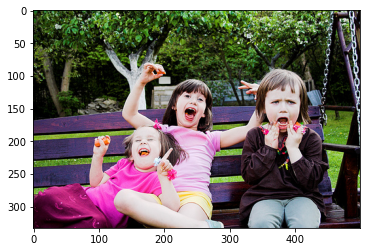


Image name: 2498897831_0bbb5d5b51.jpg

Valid descriptions:
['three children are pulling faces on a purple bench', 'three little girls are sitting on a purple bench and making funny faces', 'three little girls make silly faces on a wooden swing in an over saturated photo', 'three young girls are sitting on a bench swing in a park', 'three young girls pose together outside']

Transformers attention: two children are on a purple bench

Bleu1: 0.8571428571428571

Bleu2: 0.7559289460184544

Bleu3: 0.6134904027852023

Bleu4: 0.488923022434901

Meteor: 0.6691919191919192

Cider: 0.314904448984137

 -----------------


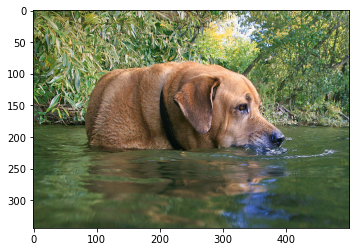


Image name: 2926233397_71e617f3a3.jpg

Valid descriptions:
['a brown dog up to its neck in water', 'a dog is almost all the way in the water and takes a drink', 'a dog possibly a basset hound stands nosedeep in pond water', 'a large dog wades through shallow water', 'the brown dog is taking a drink while wading in the water']

Transformers attention: a dog shaking water off of a river

Bleu1: 0.5

Bleu2: 0.26726124191242434

Bleu3: 1.2399127065146701e-102

Bleu4: 7.711523862191631e-155

Meteor: 0.2949766355140187

Cider: 0.26355993391237653

 -----------------


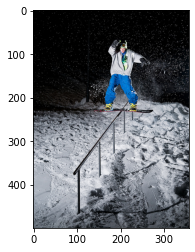


Image name: 3287549827_04dec6fb6e.jpg

Valid descriptions:
['a guy on a snowboard grinding', 'a snowboarder is attempting a trick down an outside railing', 'person in gray jacket and blue pants balancing board on handrail', 'the snowboarder is grinding on a silver rail in the nighttime snow', 'the snow borader is riding a rail']

Transformers attention: a boy in a red shirt and green pants is doing a skateboard trick on a rail

Bleu1: 0.5294117647058824

Bleu2: 0.2572478777137633

Bleu3: 1.209744862946743e-102

Bleu4: 7.565682572361624e-155

Meteor: 0.3599374021909233

Cider: 0.2667315732463745

 -----------------


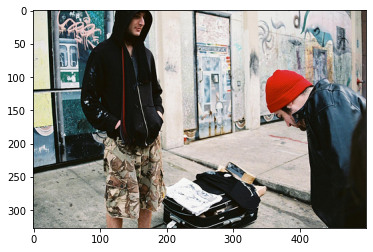


Image name: 3150742439_b8a352e1e0.jpg

Valid descriptions:
['a man in a black hoodie watching a man in a red cap', 'a man standing on a street with a suitcase in front of him while another man bends down to look at what is displayed on top of it', 'a man wearing a red hat looks down as another man watches', 'two men are standing on the street covered in graffiti', 'two people on a street one person looking down']

Transformers attention: a man in a black shirt is standing on the sidewalk

Bleu1: 0.8181818181818182

Bleu2: 0.7006490497453707

Bleu3: 0.6038632803832545

Bleu4: 0.4832697830906221

Meteor: 0.37812500000000004

Cider: 0.28414409757803005

 -----------------


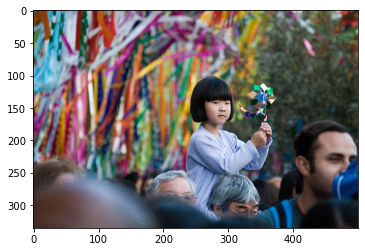


Image name: 2666205903_8d287669e1.jpg

Valid descriptions:
['a child is holding a colorful object and overlooking a crowd of people while sitting on the shoulders of an older person', 'a girl in a blue sweater sits on a person s shoulders and carries a pinwheel', 'a girls in a blue shirt holds a flower while sitting on a man s shoulders', 'a young oriential girl is standing above the crowd playing with a pinwheel', 'girl in blue sweater and holding a multicolor toy sitting on the shoulders of a man with grey hair']

Transformers attention: a girl in a pink dress holds a baby to do a

Bleu1: 0.5366925752004387

Bleu2: 0.42374134743054226

Bleu3: 0.32253779508867164

Bleu4: 0.24107473040766186

Meteor: 0.43105703819989544

Cider: 0.19188968720578947

 -----------------


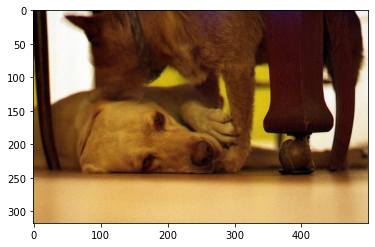


Image name: 2495931537_9b8d4474b6.jpg

Valid descriptions:
['a brown dog is sniffing a white dog that is lying on the floor', 'a dog lays under a table being sniffed by another dog', 'dog sniffing another dog lying under furniture', 'one dog sniffs another lying on the ground', 'there is a dog laying on the floor and another standing over him licking his ear']

Transformers attention: a dog is laying on its back on a blanket with a stuffed rug

Bleu1: 0.42857142857142855

Bleu2: 0.3144854510165755

Bleu3: 1.378352388516034e-102

Bleu4: 8.365126155282214e-155

Meteor: 0.17857142857142858

Cider: 0.2709065004562182

 -----------------


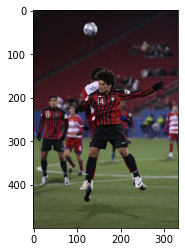


Image name: 3360930596_1e75164ce6.jpg

Valid descriptions:
['a man in a red striped soccer shirt heads a ball', 'a man in red and black is hitting a soccer ball with his head', 'a soccer ball is above the head of a man wearing black shorts and red and black striped shirt', 'a soccer player in black shorts is jumping into the air', 'the person in the red and black uniform has a ball above her head']

Transformers attention: a soccer player in a red uniform is making a soccer ball

Bleu1: 0.8333333333333334

Bleu2: 0.674199862463242

Bleu3: 0.5687069032994118

Bleu4: 0.37700638045494705

Meteor: 0.5157198014340871

Cider: 0.3458086849663192

 -----------------


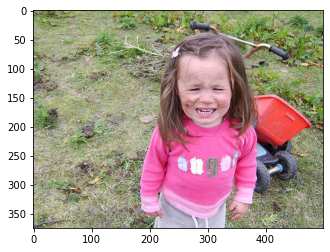


Image name: 2577972703_a22c5f2a87.jpg

Valid descriptions:
['a girl making a sad face standing in front of her tricycle', 'a little girl in a pink shirt about to cry', 'a little girl with mud on her face cries', 'a young girl with dirt on her face and a red child s bike is in the background', 'the girl in a pink top is standing next to a red tricycle looking like she is about to cry']

Transformers attention: a little girl in a hat and a hat is smiling

Bleu1: 0.6363636363636364

Bleu2: 0.5640760748177662

Bleu3: 0.47475539431667907

Bleu4: 0.40352786374639904

Meteor: 0.44158415841584164

Cider: 0.2712527290377461

 -----------------


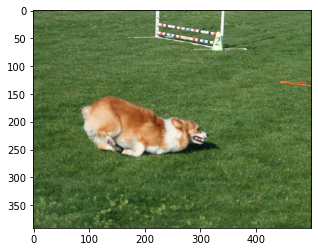


Image name: 2358898017_24496b80e8.jpg

Valid descriptions:
['a brown and white dog lays down in a grassy field', 'a dog is crouching on the grass near a hurdle', 'a dog races along the grassy track', 'a tan and white dog is competing in an agility test', 'brown and white dog playing in the grass']

Transformers attention: a small dog is playing with a white bat

Bleu1: 0.6666666666666666

Bleu2: 0.28867513459481287

Bleu3: 1.3083771130815853e-102

Bleu4: 8.014508691042773e-155

Meteor: 0.3188131313131313

Cider: 0.2683350744465929

 -----------------


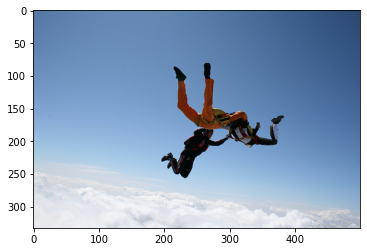


Image name: 3339140382_2e49bc324a.jpg

Valid descriptions:
['a three person sky dive team in the air performing a stunt', 'three people wearing parachutes are freefalling together through the sky', 'three skydivers are in formation above the clouds', 'trio of skydivers holding hands in sky', 'two people are parachuting over white clouds']

Transformers attention: a man in a red shirt is jumping off a hill

Bleu1: 0.2727272727272727

Bleu2: 7.789982830837433e-155

Bleu3: 5.719986955526175e-204

Bleu4: 1.3165594234639305e-231

Meteor: 0.12605042016806722

Cider: 0.16417781707287687

 -----------------


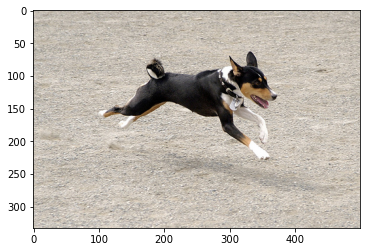


Image name: 3123463486_f5b36a3624.jpg

Valid descriptions:
['a brown black and white dog runs along on the gravel', 'a dog runs', 'a little dog running on sand', 'the brown white and black dog runs on a gravel surface', 'the dog is running across the gravel']

Transformers attention: a black dog with a red collar toy in its mouth

Bleu1: 0.2727272727272727

Bleu2: 0.1651445647689541

Bleu3: 8.969564888200866e-103

Bleu4: 6.061838450024688e-155

Meteor: 0.26315789473684215

Cider: 0.2649873052957811

 -----------------


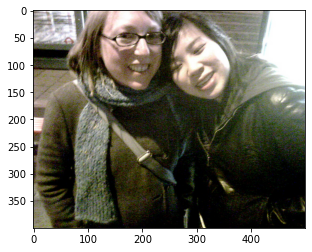


Image name: 3121521593_18f0ec14f7.jpg

Valid descriptions:
['a smiling girl in glasses and a bluegray scarf with a smiling girl in a black coat leaning on her shoulder', 'a woman leaning her head on the shoulder of another woman', 'two girls one wearing glasses dressed in cold weather clothing smile for the camera', 'two warmly dress girls posing for a picture outdoors', 'two young woman hug and pose together for a picture']

Transformers attention: a woman with a black mohawk and a black shirt

Bleu1: 0.7

Bleu2: 0.557773351022717

Bleu3: 2.02179335580419e-102

Bleu4: 1.1140407992226505e-154

Meteor: 0.25683975432719147

Cider: 0.14033055828015203

 -----------------


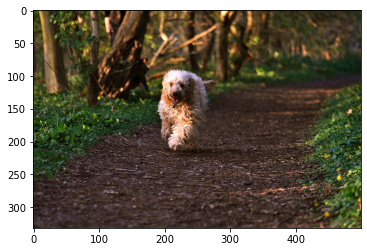


Image name: 3435035138_af32890a4c.jpg

Valid descriptions:
['a dog runs along a forest lane', 'a pale dog is running along a dirt path', 'a shaggy dog runs down a dirt trail in a lush forest', 'a white and brown shaggy dog is running down a dirt path in a park', 'the curly haired white dog is running down a wooded path']

Transformers attention: a yellow dog runs through the leaves

Bleu1: 0.5714285714285714

Bleu2: 0.3086066999241838

Bleu3: 1.36521425133137e-102

Bleu4: 8.286571670851008e-155

Meteor: 0.3650793650793651

Cider: 0.22418223780956384

 -----------------


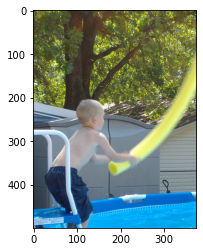


Image name: 2693425189_47740c22ed.jpg

Valid descriptions:
['a boy holding a large foam wand waves it near a swimming pool', 'a boy plays with a foam noodle toy by a pool', 'a boy plays with a noodle by the pool', 'a child with a water noodle', 'a little boy wearing blue shorts is holding a yellow noodle over a pool']

Transformers attention: a man in a swimming suit is holding a baby in the swimming pool

Bleu1: 0.5714285714285714

Bleu2: 0.41931393468876726

Bleu3: 0.24678328624083218

Bleu4: 4.2492320052205223e-78

Meteor: 0.3254877014418999

Cider: 0.19406918496943198

 -----------------


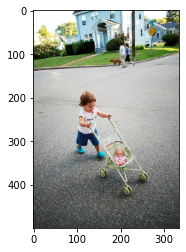


Image name: 1387785218_cee67735f5.jpg

Valid descriptions:
['a child pushes a doll in a baby carriage', 'a little girl pushing a baby doll stroller', 'a little kid in blue shoes is pushing a toy baby in a stroller', 'a small child pushes a stroller down the street', 'a young child carrying a doll in a stroller']

Transformers attention: a boy in a blue shirt is riding a toy

Bleu1: 0.7

Bleu2: 0.3944053188733077

Bleu3: 1.6084103771555296e-102

Bleu4: 9.367929145127228e-155

Meteor: 0.2573529411764706

Cider: 0.19225393440807423

 -----------------


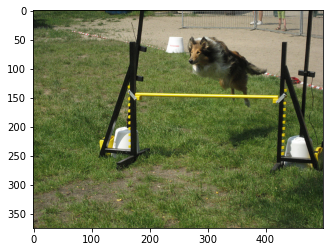


Image name: 537559285_29be110134.jpg

Valid descriptions:
['a brown and white sheltie leaping over a rail', 'a collie is running through an obstacle course', 'collie jumping over a training hurdle that is on the grass', 'collie making a jump over a yellow hurdle', 'the dog is leaping over a hurdle']

Transformers attention: a dog jumps over a bar

Bleu1: 0.5643211499270759

Bleu2: 0.3090914234923144

Bleu3: 1.293332286059347e-102

Bleu4: 7.629999090858336e-155

Meteor: 0.5717948717948719

Cider: 0.19244882323915072

 -----------------


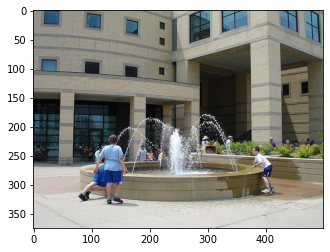


Image name: 180094434_b0f244832d.jpg

Valid descriptions:
['a few younger boys play around a fountain', 'a group of people gather around a large fountain', 'three boys play around a fountain in an office building courtyard', 'three kids are playing at a fountain in front of a building', 'three kids playing around a fountain']

Transformers attention: a little boy is jumping up to get a fountain at a fountain

Bleu1: 0.30769230769230765

Bleu2: 0.22645540682891918

Bleu3: 0.16807772401396143

Bleu4: 3.191385619211647e-78

Meteor: 0.3713235294117647

Cider: 0.2113426506687254

 -----------------


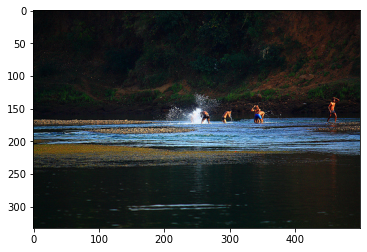


Image name: 3375991133_87d7c40925.jpg

Valid descriptions:
['a group of friends play in a lake', 'five people are in a natural water source', 'many children play in the water', 'people in bathing suits bend down and reach into the water of a lake', 'several people are playing outside in the water']

Transformers attention: a person is swimming in a lake

Bleu1: 0.5714285714285714

Bleu2: 0.4364357804719847

Bleu3: 0.3382649096002849

Bleu4: 5.395774370246974e-78

Meteor: 0.4746835443037974

Cider: 0.2210545029051257

 -----------------


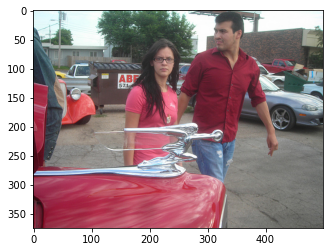


Image name: 3725202807_12fbfdd207.jpg

Valid descriptions:
['a couple in a parking lot', 'a couple walks past a car in a parking lot', 'a man and a woman are walking past a car with a fancy symbol on the front', 'a man and a woman walk past a red car with a silver hood ornament', 'a man and woman walking next to a red car with an unusual hood ornament']

Transformers attention: a girl in a yellow shirt and jeans riding a skateboard in a grocery cart

Bleu1: 0.4

Bleu2: 0.1690308509457033

Bleu3: 9.143275537115247e-103

Bleu4: 6.13274920178966e-155

Meteor: 0.37037037037037035

Cider: 0.21808622132549757

 -----------------


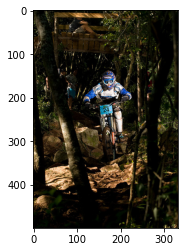


Image name: 3263395801_5e4cee2b9e.jpg

Valid descriptions:
['a dirt biker in the forest', 'a dirt biker rides his motocycle through the woods', 'a motocross bike is being ridden along a woodland path', 'a motorcyclist navigates a forest trail', 'a person rides a motorbike on a dirt path surrounded by trees']

Transformers attention: a bike rider rides a bike through the woods

Bleu1: 0.7777777777777778

Bleu2: 0.5400617248673217

Bleu3: 0.34949329281357794

Bleu4: 5.518020345386123e-78

Meteor: 0.4955555555555556

Cider: 0.1935354028022383

 -----------------


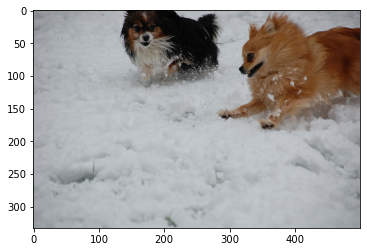


Image name: 2398605966_1d0c9e6a20.jpg

Valid descriptions:
['a black dog and a brown dog in snow', 'the small dogs play in the snow', 'two longhaired puppy dogs have a romp in the snow', 'two pomeranian dogs playing in the snow', 'two small dogs playing in the snow together']

Transformers attention: two white dogs are playing in the snow

Bleu1: 0.75

Bleu2: 0.5669467095138409

Bleu3: 0.47713192508777724

Bleu4: 0.38260294162784475

Meteor: 0.7922535211267605

Cider: 0.5264587070038769

 -----------------


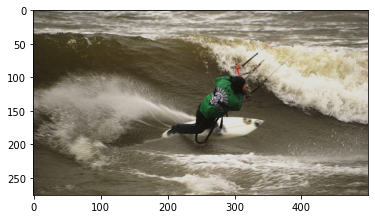


Image name: 3044536048_e615466e7f.jpg

Valid descriptions:
['a lone parasurfer surfing a huge wave in the ocean', 'a man parasurfs in the ocean', 'a person in a green jacket it surfing while holding on to a line', 'a person in green surfing a wave', 'a person on a surfboard in the waves holding onto a tether']

Transformers attention: a surfer is riding a wave on a wave

Bleu1: 0.49713295378576094

Bleu2: 0.3334869235560669

Bleu3: 1.3832359609164932e-102

Bleu4: 8.148621569148421e-155

Meteor: 0.35493827160493824

Cider: 0.20847834834295273

 -----------------


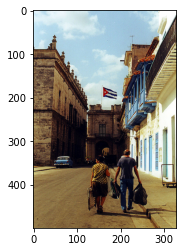


Image name: 435827376_4384c3005a.jpg

Valid descriptions:
['a couple walking down the street carrying bags', 'a man and a woman are carrying bags down an empty street', 'a man and a woman walking down a street carrying luggage', 'two people carrying various items walking down a city street', 'two people carry their bags down an unpaved road']

Transformers attention: a man is waiting to cross a silver car

Bleu1: 0.3333333333333333

Bleu2: 0.20412414523193154

Bleu3: 1.0336719708309825e-102

Bleu4: 6.7393716283177006e-155

Meteor: 0.21842355175688513

Cider: 0.14450142964896986

 -----------------


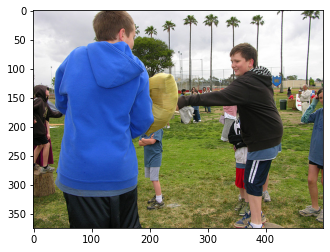


Image name: 2470486377_c3a39ccb7b.jpg

Valid descriptions:
['a boy in a black shirt punches a yellow punching bag while a boy in a blue sweatshirt holds the bag', 'many children playing outside in the grass practicing punching', 'some kids play outside on a nice day', 'the boy in the black sweatshirt is hitting the yellow object held by the boy in the blue sweatshirt', 'two boys talk on a field near palm trees']

Transformers attention: a man in a red shirt is standing in a park

Bleu1: 0.6363636363636364

Bleu2: 0.35675303400633784

Bleu3: 1.5039153137114449e-102

Bleu4: 8.909555824566607e-155

Meteor: 0.21319444444444444

Cider: 0.1630125492134874

 -----------------


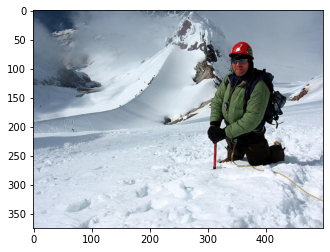


Image name: 485245061_5a5de43e20.jpg

Valid descriptions:
['a man crouched on a snowy peak', 'a man in a green jacket stands in deep snow at the base of a mountain', 'a man kneels in the snow', 'a man measures the depth of snow', 'a mountain hiker is digging steaks into the thck snow']

Transformers attention: a person in a red coat skis

Bleu1: 0.42857142857142855

Bleu2: 0.26726124191242434

Bleu3: 1.2380028450587448e-102

Bleu4: 7.711523862191631e-155

Meteor: 0.1639344262295082

Cider: 0.1979490805661765

 -----------------


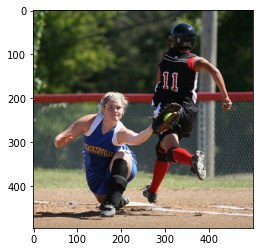


Image name: 2944952557_8484f0da8f.jpg

Valid descriptions:
['a girl in a blue and white uniform tags someone in a black and red uniform', 'a girl is catching a baseball before an opponent touches base', 'a woman in blue has a yellow ball in her mitt', 'girl in blue tries to get a base runner number out during softball game', 'two people playing ball on a field']

Transformers attention: a man in a white uniform is laying on the ground after a baseball

Bleu1: 0.6428571428571429

Bleu2: 0.3851644432598217

Bleu3: 1.5820903852846357e-102

Bleu4: 9.25753387206282e-155

Meteor: 0.3292035398230088

Cider: 0.21949707918024233

 -----------------


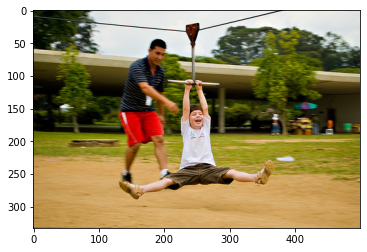


Image name: 2061354254_faa5bd294b.jpg

Valid descriptions:
['a boy hangs from a tbar while a man gives him a push', 'a little boy being pushed by an older person on playground', 'a little boy is going down a pulley swing', 'a man pushes a boy on a zip line', 'a smiling boy slides down a rope while hanging on']

Transformers attention: two men playing soccer on a field

Bleu1: 0.21470779802151024

Bleu2: 0.16398578945514342

Bleu3: 8.105251159231793e-103

Bleu4: 5.236405306969006e-155

Meteor: 0.29040404040404044

Cider: 0.1655977471991082

 -----------------


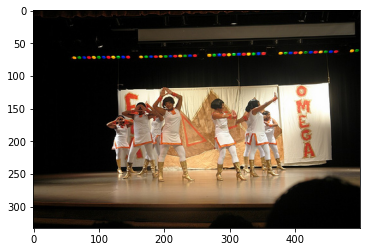


Image name: 3085226474_62aba51179.jpg

Valid descriptions:
['a group of women are performing onstage', 'people in a dance', 'some women in white perform on a stage', 'women participate in a skit onstage', 'women who look alike are performing on a stage']

Transformers attention: three women dance in a room

Bleu1: 0.6666666666666666

Bleu2: 0.36514837167011077

Bleu3: 1.52789156343154e-102

Bleu4: 9.013778876140909e-155

Meteor: 0.6084656084656085

Cider: 0.29563606901730155

 -----------------


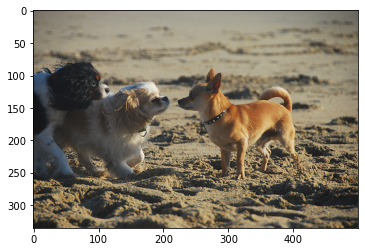


Image name: 2782433864_5a0c311d87.jpg

Valid descriptions:
['the three dogs are standing in the sand', 'three small dogs stand in the sand and stare at each other', 'three small dogs two of which are sniffing noses', 'two dogs meet and check out a third dog at the beach', 'two small dogs facing a third dog']

Transformers attention: two dogs are playing in the sand

Bleu1: 0.8571428571428571

Bleu2: 0.7559289460184544

Bleu3: 0.48805399784912856

Bleu4: 7.101238428437038e-78

Meteor: 0.6126582278481013

Cider: 0.37785311482800726

 -----------------


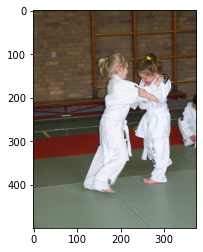


Image name: 2473738924_eca928d12f.jpg

Valid descriptions:
['two girls in karate uniforms struggle in a dojo', 'two little girls are dressed in white karate uniforms', 'two little girls practice martial arts', 'two little girls spar in a karate bout', 'two young girls sparring in white martial arts outfits while a third person watches from the side']

Transformers attention: two men in white are playing on a stage

Bleu1: 0.5555555555555556

Bleu2: 0.26352313834736496

Bleu3: 1.2297343800989291e-102

Bleu4: 7.657404561915943e-155

Meteor: 0.3506944444444444

Cider: 0.2866168216641404

 -----------------


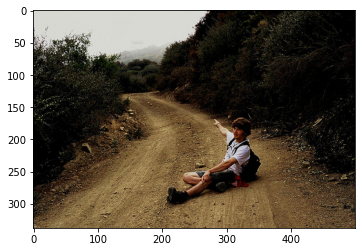


Image name: 448252603_7d928c900e.jpg

Valid descriptions:
['a boy pointing in a direction on a dirt road', 'a boy with a backpack sits on a trail and points', 'a man points his finger to the path ahead as he sits on the dirt path', 'a man with a backpack is sitting in a dirt road and pointing toward the horizon', 'a young man sitting in the middle of a dirt road pointing up the road']

Transformers attention: a boy in a red shirt is riding a bike on a gravel path

Bleu1: 0.5320358741165845

Bleu2: 0.3381028973520135

Bleu3: 1.4152018876709138e-102

Bleu4: 8.369242363753347e-155

Meteor: 0.40998931623931617

Cider: 0.27287622130566014

 -----------------


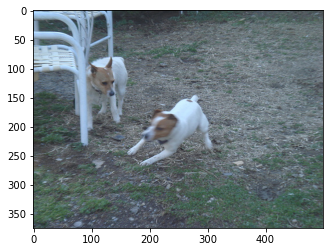


Image name: 2419221084_01a14176b4.jpg

Valid descriptions:
['a white dog runs past another dog who is standing beside some patio furniture', 'two dogs are outside near patio furniture', 'two small brown and white dogs standing beside some white chairs', 'two small dogs play on the lawn', 'two small white dogs play in the yard']

Transformers attention: two dogs are running on a gravel path

Bleu1: 0.625

Bleu2: 0.42257712736425823

Bleu3: 0.31208064768883775

Bleu4: 5.072841446586652e-78

Meteor: 0.4445422535211268

Cider: 0.2503751472530392

 -----------------


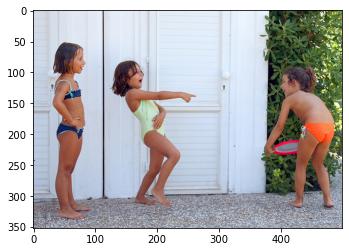


Image name: 2689001252_e0016c89f0.jpg

Valid descriptions:
['little girls in swimsuits are laughing', 'a girl in a yellow bathing suit laughs and points at a girl in an orange suit while another girls looks on', 'girl in bathing suit pointing and laughing at child in orange bathing bottoms while another girl looks on', 'the girl in yellow is laughing at the girl wearing orange whilst being watched by the girl in blue', 'three children in swimsuites are having fun outside near a white building']

Transformers attention: two girls in skimpy dresses are laying on a sand

Bleu1: 0.40936537653899097

Bleu2: 0.19297668915580327

Bleu3: 9.34360648331891e-103

Bleu4: 5.929187618737054e-155

Meteor: 0.3993055555555556

Cider: 0.25784846403568984

 -----------------


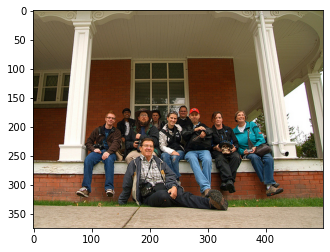


Image name: 2877503811_4e311253ec.jpg

Valid descriptions:
['a group of people are gathered on a white pillared porch for a photo', 'a group of people are sitting in front of a red brick and white trim building', 'a group of people are sitting on the porch of a brick building', 'a group of people gather in front of a red house', 'a group of ten people posing outside of a classicstyle building']

Transformers attention: a group of people are sitting on a park bench

Bleu1: 0.7238699344287677

Bleu2: 0.7137453807779461

Bleu3: 0.6610645648076443

Bleu4: 0.621251461416073

Meteor: 0.5905511811023622

Cider: 0.4156097808668859

 -----------------


In [69]:
#### Results
for i in range(0,100):
    pic = test_img[i]
    x = np.array(Image.open(pic))
    #get image name from image path
    img_name = pic.split('/')[2].split('.')[0]
    plt.imshow(x)
    plt.show()
    print("\nImage name:", img_name + ".jpg")
    print("\nValid descriptions:")
    print(descriptions[img_name])
    
    result,output,attention_weights = evaluate(pic)
    
    print("\nTransformers attention:", final_prediction(result))
    
    split_descriptions = []
    split_descriptions.append(descriptions[img_name][0].split()) 
    split_descriptions.append(descriptions[img_name][1].split()) 
    split_descriptions.append(descriptions[img_name][2].split()) 
    split_descriptions.append(descriptions[img_name][3].split()) 
    split_descriptions.append(descriptions[img_name][4].split()) 
    
    print("\nBleu1:", sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(1.0,0,0,0)))
    print("\nBleu2:", sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.5, 0.5, 0, 0)))
    print("\nBleu3:", sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.34, 0.33, 0.33, 0)))
    print("\nBleu4:", sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.25, 0.25, 0.25, 0.25)))
    print("\nMeteor:", meteor_score(descriptions[img_name],final_prediction(result)))
    print("\nCider:", cider(descriptions[img_name],final_prediction(result))[0][0])
    print("\n -----------------")


In [70]:
#preparation of metrics lists


"""
bleu1_train_scores = []
bleu2_train_scores = []
bleu3_train_scores = []
bleu4_train_scores = []
meteor_train_scores = []
cider_train_scores = []
    
for i in range(0,1):
    bleu1_train_scores.append([])
    bleu2_train_scores.append([])
    bleu3_train_scores.append([])
    bleu4_train_scores.append([])
    meteor_train_scores.append([])
    cider_train_scores.append([])

    #calculation of metrics for train images dataset
    for j in range(0,len(train_img)):
        pic = train_img[j]
        
        img_name = pic.split('/')[2].split('.')[0]
        split_descriptions = []
        split_descriptions.append(descriptions[img_name][0].split()) 
        split_descriptions.append(descriptions[img_name][1].split()) 
        split_descriptions.append(descriptions[img_name][2].split()) 
        split_descriptions.append(descriptions[img_name][3].split()) 
        split_descriptions.append(descriptions[img_name][4].split())
        
        result,output,attention_weights = evaluate(pic)
        result = remove_unknown_token(result)
        
        bleu1_train_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(1.0,0,0,0)))
        bleu2_train_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.5, 0.5, 0, 0)))
        bleu3_train_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.34, 0.33, 0.33, 0)))
        bleu4_train_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.25, 0.25, 0.25, 0.25)))
        meteor_train_scores[i].append(meteor_score(descriptions[pic.split('/')[2].split('.')[0]],final_prediction(result)))
        cider_train_scores[i].append(cider(descriptions[pic.split('/')[2].split('.')[0]],final_prediction(result))[0][0])

        clear_output(wait=True)
        print('train',i,j, flush=True)

result_data_tren = {}

#calculate mean score based on socres list for each metric
for i in range(0,1):
    result_data_tren[str(i)] = [
        mean(bleu1_train_scores[i]),
        mean(bleu2_train_scores[i]),
        mean(bleu3_train_scores[i]),
        mean(bleu4_train_scores[i]),
        mean(meteor_train_scores[i]),
        mean(cider_train_scores[i]),
    ]

result = pd.DataFrame.from_dict(
    result_data_tren,
    orient='index',
    columns=['Bleu1 TREN','Bleu2 TREN','Bleu3 TREN','Bleu4 TREN','Meteor TREN','CIDEr TREN']
)

result
"""

"\nbleu1_train_scores = []\nbleu2_train_scores = []\nbleu3_train_scores = []\nbleu4_train_scores = []\nmeteor_train_scores = []\ncider_train_scores = []\n    \nfor i in range(0,1):\n    bleu1_train_scores.append([])\n    bleu2_train_scores.append([])\n    bleu3_train_scores.append([])\n    bleu4_train_scores.append([])\n    meteor_train_scores.append([])\n    cider_train_scores.append([])\n\n    #calculation of metrics for train images dataset\n    for j in range(0,len(train_img)):\n        pic = train_img[j]\n        \n        img_name = pic.split('/')[2].split('.')[0]\n        split_descriptions = []\n        split_descriptions.append(descriptions[img_name][0].split()) \n        split_descriptions.append(descriptions[img_name][1].split()) \n        split_descriptions.append(descriptions[img_name][2].split()) \n        split_descriptions.append(descriptions[img_name][3].split()) \n        split_descriptions.append(descriptions[img_name][4].split())\n        \n        result,output,att

In [71]:
#preparation of metrics lists
bleu1_test_scores = []
bleu2_test_scores = []
bleu3_test_scores = []
bleu4_test_scores = []
meteor_test_scores = []
cider_test_scores = []
    
for i in range(0,1):

    bleu1_test_scores.append([])
    bleu2_test_scores.append([])
    bleu3_test_scores.append([])
    bleu4_test_scores.append([])
    meteor_test_scores.append([])
    cider_test_scores.append([])

    #calculation of metrics for test images dataset
    for j in range(0,len(test_img)):
        pic = test_img[j]
        
        img_name = pic.split('/')[2].split('.')[0]
        split_descriptions = []
        split_descriptions.append(descriptions[img_name][0].split()) 
        split_descriptions.append(descriptions[img_name][1].split()) 
        split_descriptions.append(descriptions[img_name][2].split()) 
        split_descriptions.append(descriptions[img_name][3].split()) 
        split_descriptions.append(descriptions[img_name][4].split())

        result,output,attention_weights = evaluate(pic)
        result = remove_unknown_token(result)
        
        bleu1_test_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(1.0,0,0,0)))
        bleu2_test_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.5, 0.5, 0, 0)))
        bleu3_test_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.34, 0.33, 0.33, 0)))
        bleu4_test_scores[i].append(sentence_bleu(split_descriptions,final_prediction(result).split(), weights=(0.25, 0.25, 0.25, 0.25)))
        meteor_test_scores[i].append(meteor_score(descriptions[pic.split('/')[2].split('.')[0]],final_prediction(result)))
        cider_test_scores[i].append(cider(descriptions[pic.split('/')[2].split('.')[0]],final_prediction(result))[0][0])

        clear_output(wait=True)
        print('test',i,j, flush=True)


result_data_test = {}

#calculate mean score based on socres list for each metric
for i in range(0,1):
    result_data_test[str(i)] = [
        mean(bleu1_test_scores[i]),
        mean(bleu2_test_scores[i]),
        mean(bleu3_test_scores[i]),
        mean(bleu4_test_scores[i]),
        mean(meteor_test_scores[i]),
        mean(cider_test_scores[i])
    ]

result = pd.DataFrame.from_dict(
    result_data_test,
    orient='index',
    columns=['Bleu1 TEST','Bleu2 TEST','Bleu3 TEST','Bleu4 TEST','Meteor TEST', 'CIDEr TEST']
)

result

test 0 999


,Bleu1 TEST,Bleu2 TEST,Bleu3 TEST,Bleu4 TEST,Meteor TEST,CIDEr TEST
0,0.539835,0.346093,0.172328,0.070463,0.36882,0.244121
